In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [3]:
full_data = pd.read_csv('/Users/cooru.i/Desktop/PNSL/! Graduate Thesis/pre_base+fu_total_1023.csv')

In [8]:
display(full_data.head())
print(len(full_data))

,sex,age,ladder_personal,ladder_society,education,edu_mom,edu_dad,income,SES,PHQ9,IUS,GAD_base,Anx_group_base,CFI,DERS,DO,GAD_fu,Anx_group_fu
0,2,24.0,5,1,4,5.0,5.0,10.0,4,13,47,5,2,73,73,65,11,2
1,2,28.0,4,5,5,4.0,4.0,6.0,2,1,24,0,1,96,41,55,0,1
2,2,26.0,5,3,5,5.0,5.0,8.0,3,27,47,21,2,70,65,90,20,2
3,2,25.0,4,5,5,4.0,4.0,NaN,3,10,28,16,2,93,47,79,8,2
4,2,23.0,7,8,5,5.0,5.0,10.0,4,17,57,20,2,71,82,94,15,2


1949


In [9]:
print(full_data.shape)
print(full_data.isnull().sum())

(1949, 18)
sex                  0
age                  4
ladder_personal      0
ladder_society       0
education            0
edu_mom             82
edu_dad             95
income             721
SES                  0
PHQ9                 0
IUS                  0
GAD_base             0
Anx_group_base       0
CFI                  0
DERS                 0
DO                   0
GAD_fu               0
Anx_group_fu         0
dtype: int64


In [10]:
print(full_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1949 entries, 0 to 1948
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sex              1949 non-null   int64  
 1   age              1945 non-null   float64
 2   ladder_personal  1949 non-null   int64  
 3   ladder_society   1949 non-null   int64  
 4   education        1949 non-null   int64  
 5   edu_mom          1867 non-null   float64
 6   edu_dad          1854 non-null   float64
 7   income           1228 non-null   float64
 8   SES              1949 non-null   int64  
 9   PHQ9             1949 non-null   int64  
 10  IUS              1949 non-null   int64  
 11  GAD_base         1949 non-null   int64  
 12  Anx_group_base   1949 non-null   int64  
 13  CFI              1949 non-null   int64  
 14  DERS             1949 non-null   int64  
 15  DO               1949 non-null   int64  
 16  GAD_fu           1949 non-null   int64  
 17  Anx_group_fu  

In [11]:
display(full_data.describe())

,sex,age,ladder_personal,ladder_society,education,edu_mom,edu_dad,income,SES,PHQ9,IUS,GAD_base,Anx_group_base,CFI,DERS,DO,GAD_fu,Anx_group_fu
count,1949.000000,1945.000000,1949.000000,1949.000000,1949.000000,1867.000000,1854.000000,1228.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000
mean,1.909697,23.112596,5.264238,5.167778,4.982555,4.621318,4.733010,6.750000,3.057978,8.261673,32.832222,6.106721,1.500257,94.818881,43.852232,59.123653,5.849666,1.479733
std,0.286689,3.119560,1.608964,1.761459,0.470597,0.736170,0.818314,3.321444,0.947397,6.734422,11.196127,5.623260,0.500128,16.258011,14.616617,14.264465,5.478301,0.499717
min,1.000000,16.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,12.000000,0.000000,1.000000,28.000000,18.000000,18.000000,0.000000,1.000000
25%,2.000000,20.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,3.000000,3.000000,24.000000,2.000000,1.000000,85.000000,32.000000,50.000000,1.000000,1.000000
50%,2.000000,23.000000,5.000000,5.000000,5.000000,5.000000,5.000000,8.000000,3.000000,6.000000,32.000000,5.000000,2.000000,95.000000,42.000000,60.000000,4.000000,1.000000
75%,2.000000,26.000000,6.000000,6.000000,5.000000,5.000000,5.000000,10.000000,4.000000,13.000000,41.000000,9.000000,2.000000,106.000000,54.000000,69.000000,9.000000,2.000000
max,2.000000,33.000000,10.000000,10.000000,6.000000,6.000000,6.000000,10.000000,5.000000,27.000000,60.000000,21.000000,2.000000,139.000000,89.000000,95.000000,21.000000,2.000000


In [12]:
# 'age' 열 중간값으로 결측값 채우기

full_data['age'].fillna(full_data['age'].median(), inplace=True)

/var/folders/_j/ygr94mmx6rs09px9_pzz74100000gn/T/ipykernel_1351/335025755.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  full_data['age'].fillna(full_data['age'].median(), inplace=True)


In [13]:
print(full_data.isnull().sum())

sex                  0
age                  0
ladder_personal      0
ladder_society       0
education            0
edu_mom             82
edu_dad             95
income             721
SES                  0
PHQ9                 0
IUS                  0
GAD_base             0
Anx_group_base       0
CFI                  0
DERS                 0
DO                   0
GAD_fu               0
Anx_group_fu         0
dtype: int64


In [14]:
display(full_data.describe())

,sex,age,ladder_personal,ladder_society,education,edu_mom,edu_dad,income,SES,PHQ9,IUS,GAD_base,Anx_group_base,CFI,DERS,DO,GAD_fu,Anx_group_fu
count,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1867.000000,1854.000000,1228.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000
mean,1.909697,23.112365,5.264238,5.167778,4.982555,4.621318,4.733010,6.750000,3.057978,8.261673,32.832222,6.106721,1.500257,94.818881,43.852232,59.123653,5.849666,1.479733
std,0.286689,3.116360,1.608964,1.761459,0.470597,0.736170,0.818314,3.321444,0.947397,6.734422,11.196127,5.623260,0.500128,16.258011,14.616617,14.264465,5.478301,0.499717
min,1.000000,16.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,12.000000,0.000000,1.000000,28.000000,18.000000,18.000000,0.000000,1.000000
25%,2.000000,20.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,3.000000,3.000000,24.000000,2.000000,1.000000,85.000000,32.000000,50.000000,1.000000,1.000000
50%,2.000000,23.000000,5.000000,5.000000,5.000000,5.000000,5.000000,8.000000,3.000000,6.000000,32.000000,5.000000,2.000000,95.000000,42.000000,60.000000,4.000000,1.000000
75%,2.000000,26.000000,6.000000,6.000000,5.000000,5.000000,5.000000,10.000000,4.000000,13.000000,41.000000,9.000000,2.000000,106.000000,54.000000,69.000000,9.000000,2.000000
max,2.000000,33.000000,10.000000,10.000000,6.000000,6.000000,6.000000,10.000000,5.000000,27.000000,60.000000,21.000000,2.000000,139.000000,89.000000,95.000000,21.000000,2.000000


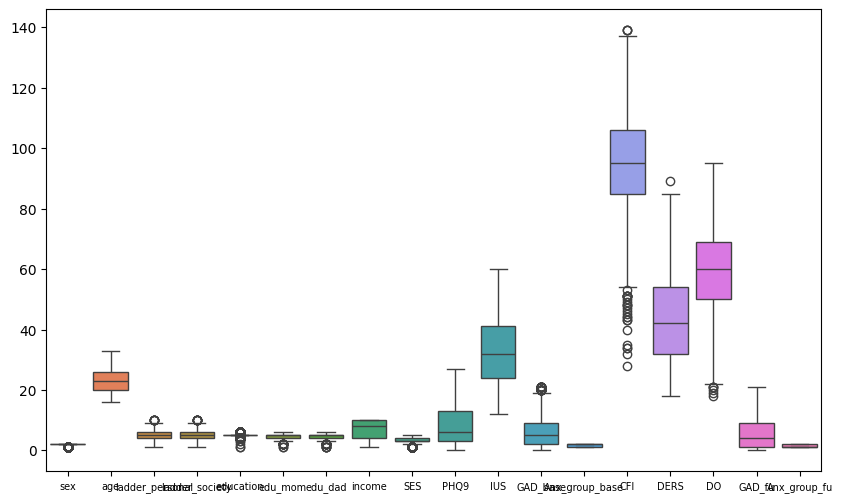

In [9]:
# detecting outliers with boxplot

plt.figure(figsize=(10, 6))
sns.boxplot(data=full_data)
plt.xticks(fontsize=7)
plt.show()

### Histogram

In [15]:
def plot_histograms(df):
   
    # 데이터프레임의 수치형 변수만 선택
    numeric_columns = df.select_dtypes(include='number').columns
    
    # 각 수치형 변수에 대해 히스토그램을 그림
    for col in numeric_columns:
        plt.figure(figsize=(5, 3))
        df[col].hist(bins=30, edgecolor='k', alpha=0.7)
        plt.title(f'Histogram of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.grid(False)
        plt.show()


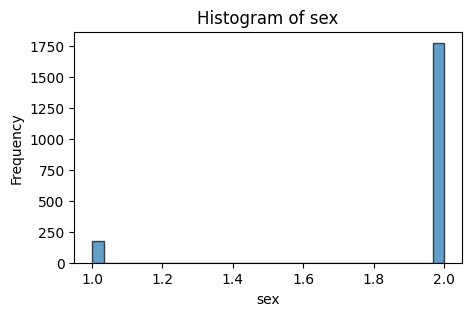

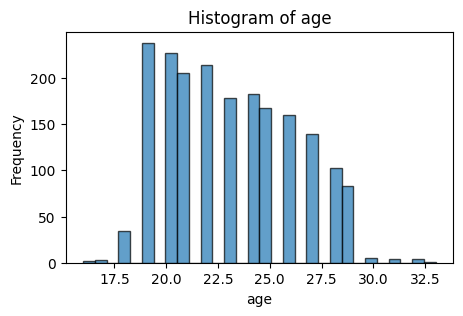

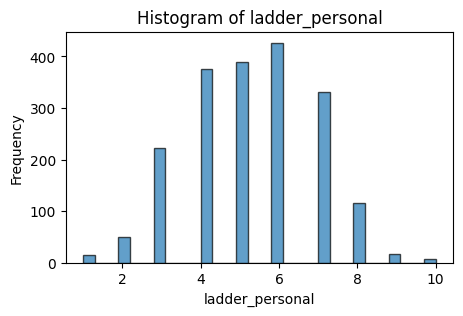

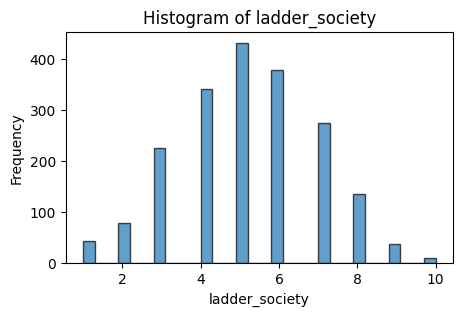

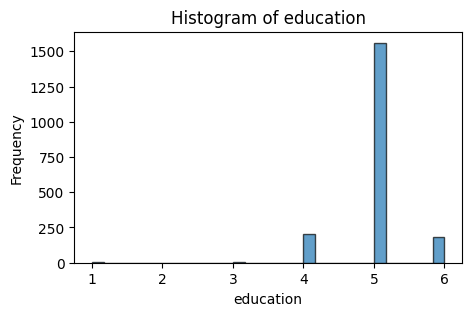

...

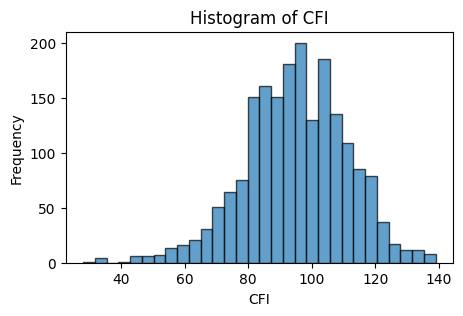

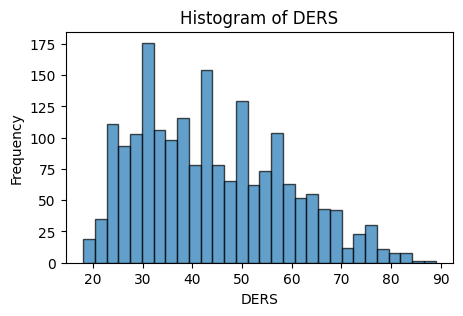

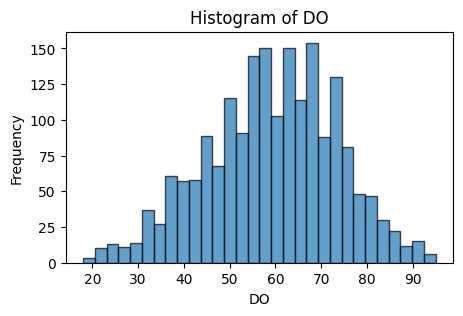

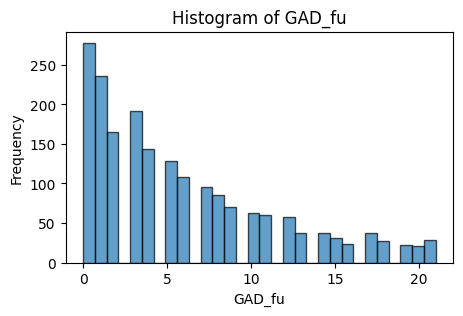

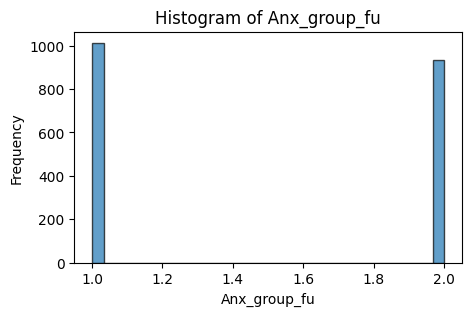

In [16]:
plot_histograms(full_data)

In [17]:
def plot_all_histograms_by_category(df, category_col):

    # 데이터프레임의 수치형 변수만 선택
    numeric_columns = df.select_dtypes(include='number').columns
    
    # 각 수치형 변수에 대해 히스토그램을 그림
    for col in numeric_columns:
        plt.figure(figsize=(6, 3))
        sns.histplot(data=df, x=col, hue=category_col, multiple="dodge", bins=30, edgecolor='k')
        plt.title(f'Histogram of {col} by {category_col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

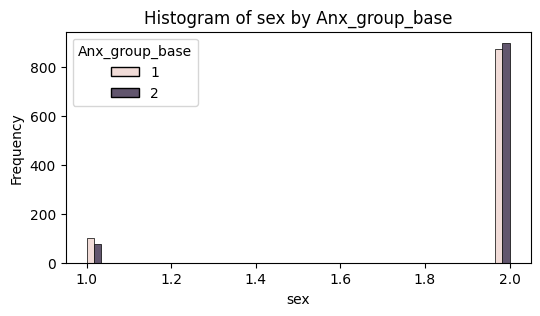

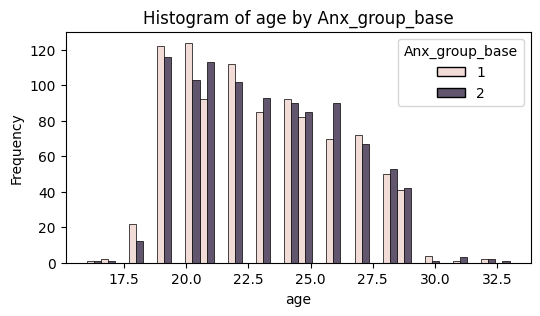

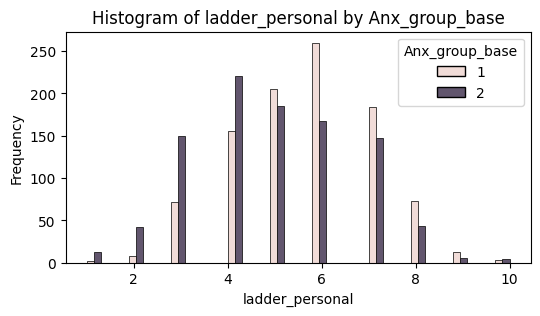

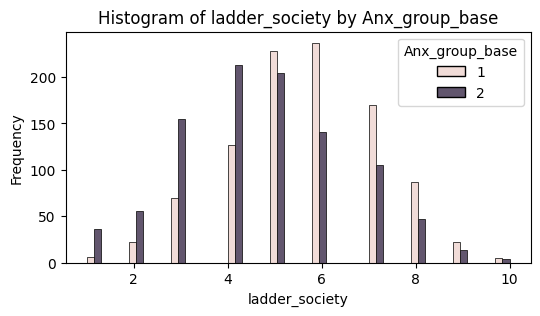

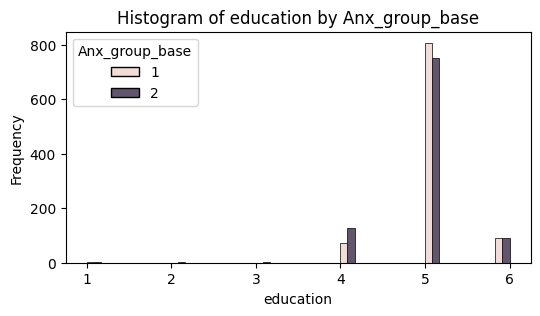

...

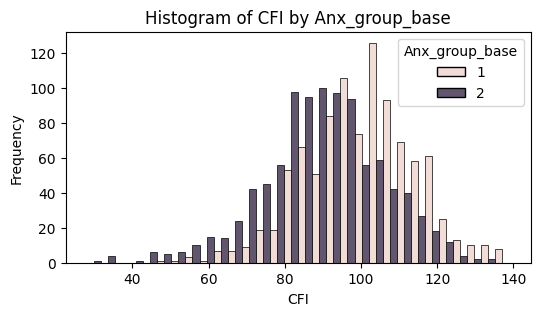

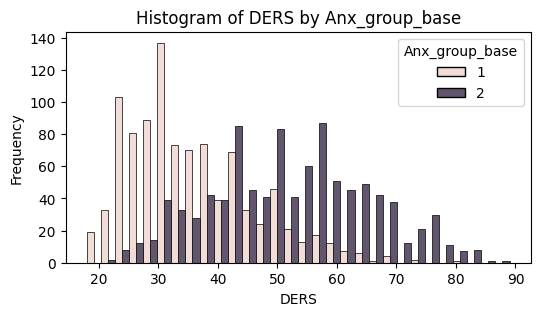

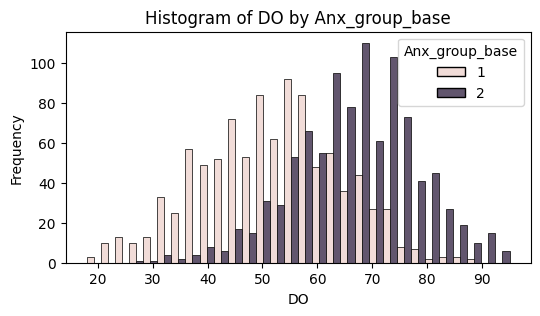

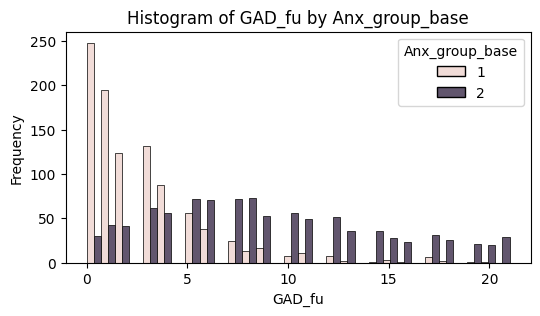

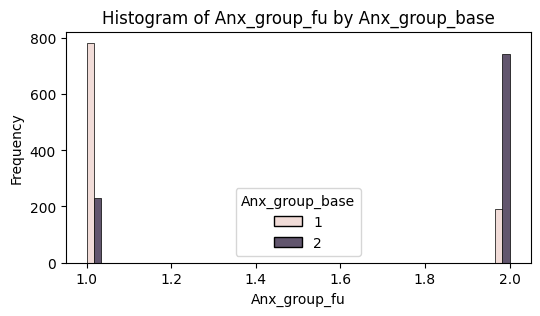

In [18]:
# baseline 불안 그룹에 따른 히스토그램

plot_all_histograms_by_category(full_data, 'Anx_group_base')

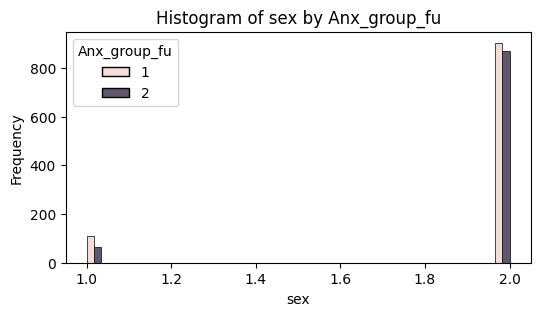

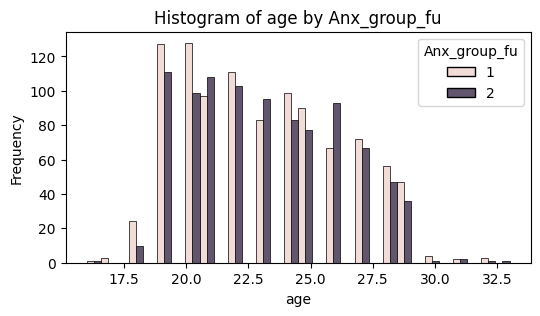

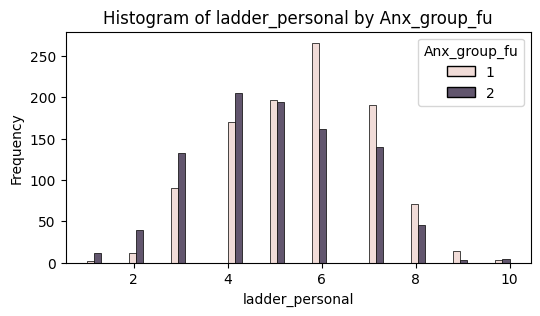

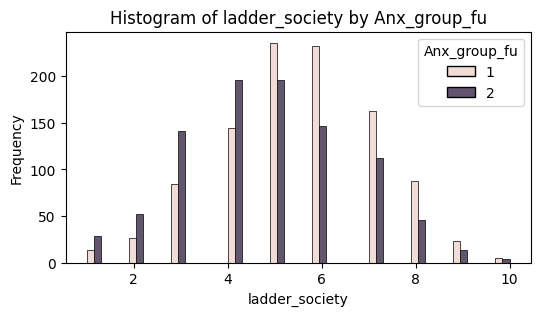

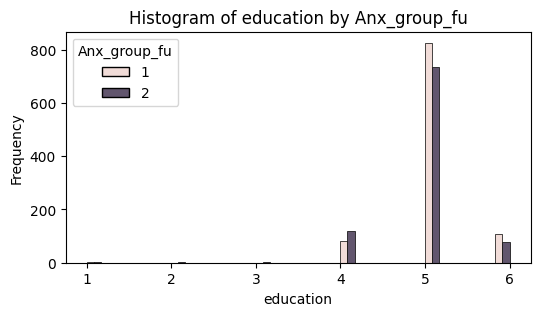

...

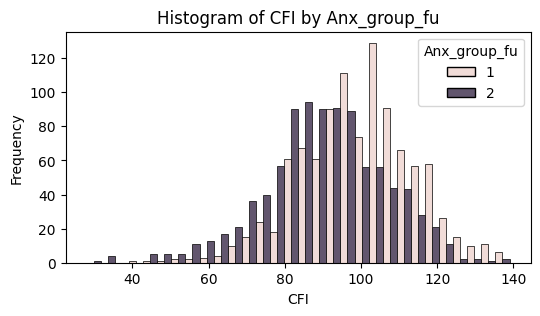

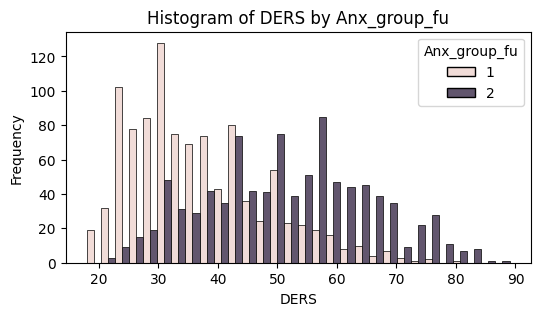

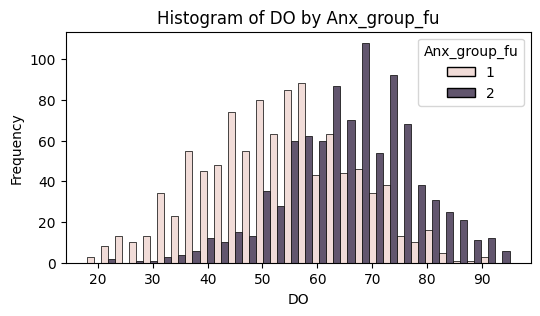

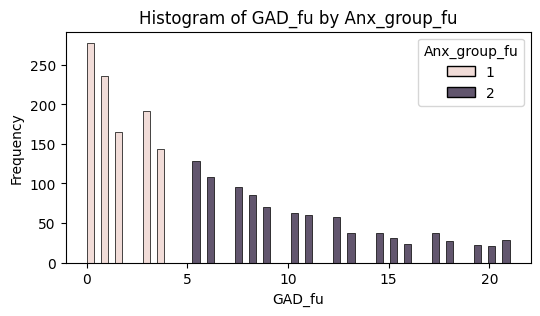

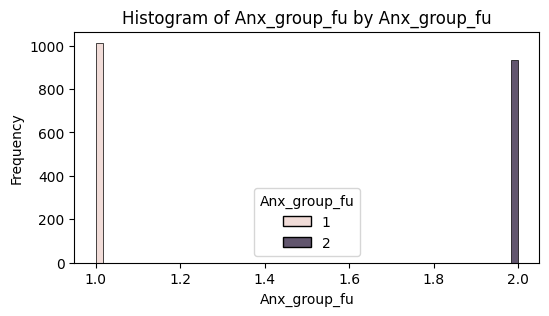

In [19]:
# follow up 불안 그룹에 따른 히스토그램

plot_all_histograms_by_category(full_data, 'Anx_group_fu')

### correlation

In [10]:
# correlation matrix

corr_matrix = full_data.corr()
display(corr_matrix)

,sex,age,ladder_personal,ladder_society,education,edu_mom,edu_dad,income,SES,PHQ9,IUS,GAD_base,Anx_group_base,CFI,DERS,DO,GAD_fu,Anx_group_fu
sex,1.000000,-0.045108,-0.041727,-0.023859,0.007342,-0.015912,-0.018004,0.007425,-0.027964,0.059042,-0.008241,0.048651,0.043125,-0.081708,0.055739,0.048048,0.050513,0.066050
age,-0.045108,1.000000,-0.055820,-0.069371,0.244605,-0.116690,-0.098621,-0.059468,-0.052745,0.022647,-0.018709,0.019508,0.029857,-0.007091,-0.000377,-0.007905,0.022466,0.018207
ladder_personal,-0.041727,-0.055820,1.000000,0.576828,0.186433,0.278856,0.269821,0.467316,0.617346,-0.266388,-0.204453,-0.246980,-0.205184,0.236539,-0.234367,-0.184253,-0.228217,-0.174342
ladder_society,-0.023859,-0.069371,0.576828,1.000000,0.139775,0.143908,0.167008,0.203941,0.386376,-0.326362,-0.187756,-0.282137,-0.250908,0.265445,-0.278195,-0.191730,-0.252627,-0.190631
education,0.007342,0.244605,0.186433,0.139775,1.000000,0.074716,0.040843,0.054546,0.115108,-0.132192,-0.051122,-0.135863,-0.065415,0.061986,-0.082020,-0.025909,-0.122680,-0.084455
edu_mom,-0.015912,-0.116690,0.278856,0.143908,0.074716,1.000000,0.508447,0.287557,0.320930,-0.055496,-0.064218,-0.083114,-0.064038,0.060966,-0.022031,-0.025064,-0.072317,-0.061785
edu_dad,-0.018004,-0.098621,0.269821,0.167008,0.040843,0.508447,1.000000,0.308016,0.346731,-0.054517,-0.004786,-0.053796,-0.041717,0.046487,-0.017214,-0.024114,-0.054030,-0.037387
income,0.007425,-0.059468,0.467316,0.203941,0.054546,0.287557,0.308016,1.000000,0.600362,-0.048626,-0.050815,-0.044560,-0.052157,0.022401,-0.060840,-0.079044,-0.047321,-0.048294
SES,-0.027964,-0.052745,0.617346,0.386376,0.115108,0.320930,0.346731,0.600362,1.000000,-0.170460,-0.117169,-0.169790,-0.136001,0.170856,-0.168239,-0.126834,-0.165574,-0.141188
PHQ9,0.059042,0.022647,-0.266388,-0.326362,-0.132192,-0.055496,-0.054517,-0.048626,-0.170460,1.000000,0.411039,0.753218,0.620311,-0.381318,0.619239,0.511525,0.613468,0.517623


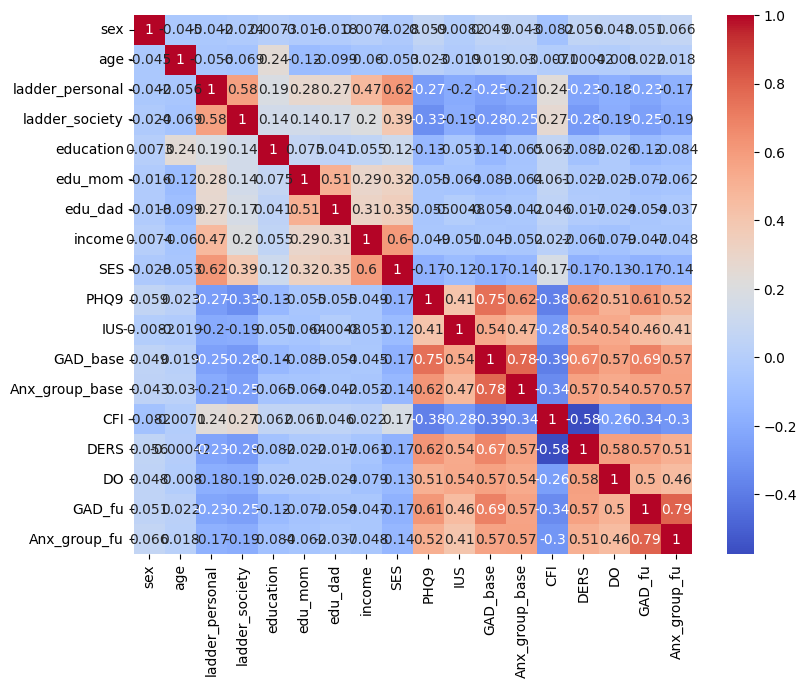

In [20]:
# Correlation heatmap

plt.figure(figsize=(9, 7))
sns.heatmap(full_data.corr(), annot=True, cmap='coolwarm')
plt.show()

In [21]:
# 분석에 사용할 변수만 선택

selected_var = ['age', 'education', 'SES', 'PHQ9', 'IUS', 'GAD_base',
                'Anx_group_base', 'CFI', 'DERS', 'DO', 'GAD_fu', 'Anx_group_fu']

df = full_data[selected_var]

In [22]:
display(df)

,age,education,SES,PHQ9,IUS,GAD_base,Anx_group_base,CFI,DERS,DO,GAD_fu,Anx_group_fu
0,24.0,4,4,13,47,5,2,73,73,65,11,2
1,28.0,5,2,1,24,0,1,96,41,55,0,1
2,26.0,5,3,27,47,21,2,70,65,90,20,2
3,25.0,5,3,10,28,16,2,93,47,79,8,2
4,23.0,5,4,17,57,20,2,71,82,94,15,2
...,...,...,...,...,...,...,...,...,...,...,...,...
1944,25.0,5,3,2,19,4,1,105,23,53,2,1
1945,26.0,5,4,3,30,2,1,117,29,57,3,1
1946,24.0,6,3,7,42,2,1,84,61,75,5,2
1947,24.0,5,3,4,26,0,1,107,23,61,0,1


In [23]:
# Anx_group -> 0, 1로 변환

df['Anx_group_base'] = df['Anx_group_base'].map({1: 0, 2: 1})
df['Anx_group_fu'] = df['Anx_group_fu'].map({1: 0, 2: 1})

/var/folders/_j/ygr94mmx6rs09px9_pzz74100000gn/T/ipykernel_1351/2045895753.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Anx_group_base'] = df['Anx_group_base'].map({1: 0, 2: 1})
/var/folders/_j/ygr94mmx6rs09px9_pzz74100000gn/T/ipykernel_1351/2045895753.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Anx_group_fu'] = df['Anx_group_fu'].map({1: 0, 2: 1})


In [24]:
# 데이터 정규화/표준화

exclude_columns = ['Anx_group_base', 'Anx_group_fu']

columns_to_scale = [col for col in df.columns if col not in exclude_columns]

scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

display(df_scaled)

,age,education,SES,PHQ9,IUS,GAD_base,Anx_group_base,CFI,DERS,DO,GAD_fu,Anx_group_fu
0,0.284904,-2.088427,0.994581,0.703779,1.265743,-0.196862,1,-1.342383,1.994665,0.412063,0.940375,1
1,1.568782,0.037079,-1.117008,-1.078569,-0.789066,-1.086254,0,0.072667,-0.195186,-0.289160,-1.068062,0
2,0.926843,0.037079,-0.061213,2.783184,1.265743,2.649193,1,-1.526955,1.447202,2.165120,2.583641,1
3,0.605873,0.037079,-0.061213,0.258192,-0.431708,1.759801,1,-0.111905,0.215411,1.393775,0.392619,1
4,-0.036066,0.037079,0.994581,1.297895,2.159138,2.471315,1,-1.465431,2.610560,2.445609,1.670715,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1944,0.605873,0.037079,-0.061213,-0.930040,-1.235764,-0.374740,0,0.626382,-1.426977,-0.429404,-0.702892,0
1945,0.926843,0.037079,0.994581,-0.781511,-0.253029,-0.730497,0,1.364669,-1.016380,-0.148915,-0.520307,0
1946,0.284904,2.162585,-0.061213,-0.187395,0.819045,-0.730497,0,-0.665620,1.173470,1.113285,-0.155137,1
1947,0.284904,0.037079,-0.061213,-0.632982,-0.610387,-1.086254,0,0.749430,-1.426977,0.131574,-1.068062,0


### logistic regression - demo O + baseline GAD

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [26]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix

In [42]:
# demo 변수 포함 + baseline GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [51]:
# VIF 계산

vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)

     Feature       VIF
0        age  1.074960
1  education  1.102857
2        SES  1.062345
3       PHQ9  1.765846
4        IUS  1.586406
5        CFI  1.534349
6       DERS  2.623352
7         DO  1.814147


In [43]:
# 로지스틱 회귀 모델 생성
logreg = LogisticRegression()

# 모델 학습
logreg.fit(X_train, y_train)

# 예측
y_pred = logreg.predict(X_test)
y_prob = logreg.predict_proba(X_test)[:, 1]

In [49]:
# 변수 중요도 확인

coefficients = pd.DataFrame(logreg.coef_.T, X.columns, columns=['Coefficient'])
print(coefficients)

           Coefficient
age           0.111769
education     0.022907
SES          -0.023316
PHQ9          1.469187
IUS           0.577966
CFI          -0.141396
DERS          0.499994
DO            0.633954


In [46]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.85
Precision: 0.83
Recall: 0.86
F1 Score: 0.84
AUC: 0.92


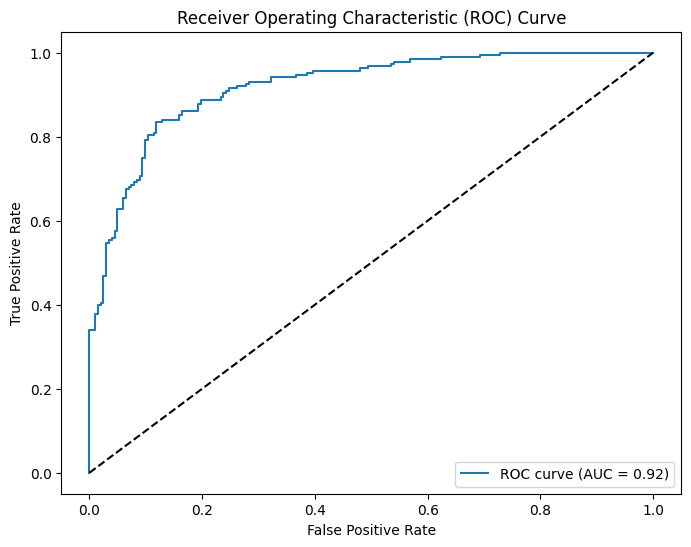

In [47]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

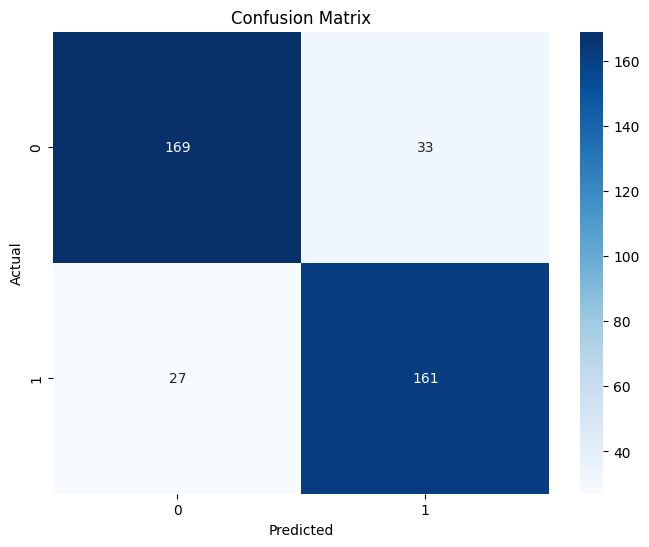

In [48]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [53]:
## demo variables 통제한 후 anx_group_base logistic regression

# 종속 변수와 독립 변수를 결합한 데이터 프레임 생성
X_train = sm.add_constant(X_train)  # 상수항 추가
logit_model = sm.Logit(y_train, X_train)  # 로지스틱 회귀 모델 생성

# 모델 학습
result = logit_model.fit()

# 결과 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.370382
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:         Anx_group_base   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1550
Method:                           MLE   Df Model:                            8
Date:                Wed, 24 Jul 2024   Pseudo R-squ.:                  0.4656
Time:                        17:19:45   Log-Likelihood:                -577.43
converged:                       True   LL-Null:                       -1080.5
Covariance Type:            nonrobust   LLR p-value:                6.723e-212
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2502      0.079      3.157      0.002       0.095       0.406
age            0.1121      0.

In [58]:
# 특정 변수를 통제한 모델 생성
control_vars = ['age', 'education', 'SES']
target_var = X.drop(control_vars, axis=1).columns.tolist()

# 통제 변수와 타겟 변수를 포함한 데이터 프레임 생성
X_train_controlled = X_train[control_vars + target_var]

# 상수항 추가
X_train_controlled = sm.add_constant(X_train_controlled)

# 로지스틱 회귀 모델 생성
logit_model_controlled = sm.Logit(y_train, X_train_controlled)

# 모델 학습
result_controlled = logit_model_controlled.fit()

# 결과 출력
print(result_controlled.summary())

Optimization terminated successfully.
         Current function value: 0.370382
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:         Anx_group_base   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1550
Method:                           MLE   Df Model:                            8
Date:                Wed, 24 Jul 2024   Pseudo R-squ.:                  0.4656
Time:                        17:43:42   Log-Likelihood:                -577.43
converged:                       True   LL-Null:                       -1080.5
Covariance Type:            nonrobust   LLR p-value:                6.723e-212
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2502      0.079      3.157      0.002       0.095       0.406
age            0.1121      0.

In [60]:
# 예측
X_test_controlled = X_test[control_vars + target_var]
X_test_controlled = sm.add_constant(X_test_controlled)
y_pred = result_controlled.predict(X_test_controlled)
y_pred_class = (y_pred > 0.5).astype(int)

# 평가
print("Accuracy:", accuracy_score(y_test, y_pred_class))
print("Classification Report:\n", classification_report(y_test, y_pred_class))

Accuracy: 0.8461538461538461
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.84      0.85       202
           1       0.83      0.86      0.84       188

    accuracy                           0.85       390
   macro avg       0.85      0.85      0.85       390
weighted avg       0.85      0.85      0.85       390



### logistic regression - demo O + follow up GAD

In [74]:
# demo 변수 포함 + follow up GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [75]:
# VIF 계산

vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)

     Feature       VIF
0        age  1.074960
1  education  1.102857
2        SES  1.062345
3       PHQ9  1.765846
4        IUS  1.586406
5        CFI  1.534349
6       DERS  2.623352
7         DO  1.814147


In [76]:
# 로지스틱 회귀 모델 생성
logreg = LogisticRegression()

# 모델 학습
logreg.fit(X_train, y_train)

# 예측
y_pred = logreg.predict(X_test)
y_prob = logreg.predict_proba(X_test)[:, 1]

print(result.summary())

                           Logit Regression Results                           
Dep. Variable:         Anx_group_base   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1550
Method:                           MLE   Df Model:                            8
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.4656
Time:                        16:56:54   Log-Likelihood:                -577.43
converged:                       True   LL-Null:                       -1080.5
Covariance Type:            nonrobust   LLR p-value:                6.723e-212
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2502      0.079      3.157      0.002       0.095       0.406
age            0.1121      0.078      1.445      0.148      -0.040       0.264
education      0.0241      0.080      0.300      0.7

In [77]:
# 변수 중요도 확인

coefficients = pd.DataFrame(logreg.coef_.T, X.columns, columns=['Coefficient'])
print(coefficients)

           Coefficient
age           0.080047
education    -0.075875
SES          -0.148099
PHQ9          0.798949
IUS           0.348183
CFI          -0.055617
DERS          0.490501
DO            0.452212


In [78]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.77
Precision: 0.81
Recall: 0.71
F1 Score: 0.76
AUC: 0.84


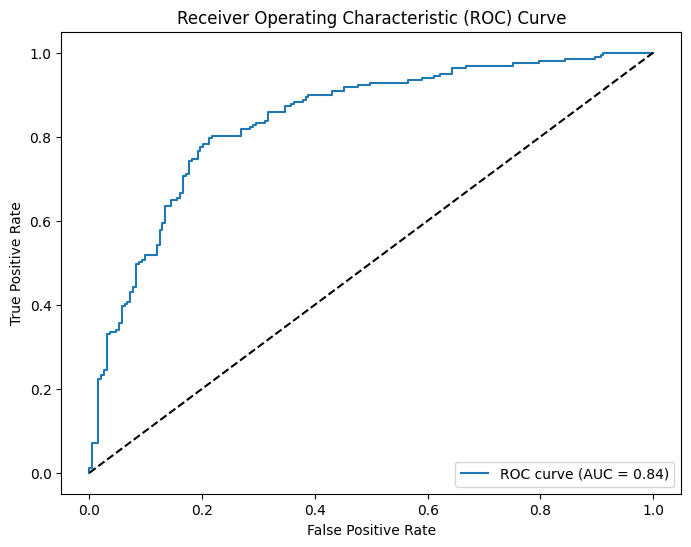

In [79]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

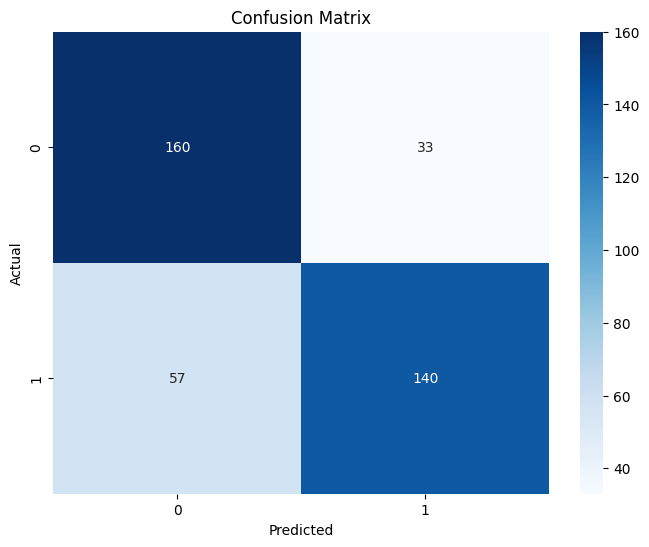

In [80]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [81]:
## demo variables 통제한 후 anx_group_fu logistic regression

# 종속 변수와 독립 변수를 결합한 데이터 프레임 생성
X_train = sm.add_constant(X_train)  # 상수항 추가
logit_model = sm.Logit(y_train, X_train)  # 로지스틱 회귀 모델 생성

# 모델 학습
result = logit_model.fit()

# 결과 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.473841
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:           Anx_group_fu   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1550
Method:                           MLE   Df Model:                            8
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.3150
Time:                        17:13:56   Log-Likelihood:                -738.72
converged:                       True   LL-Null:                       -1078.4
Covariance Type:            nonrobust   LLR p-value:                1.970e-141
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0889      0.065     -1.359      0.174      -0.217       0.039
age            0.0810      0.

In [82]:
# 특정 변수를 통제한 모델 생성
control_vars = ['age', 'education', 'SES']
target_var = X.drop(control_vars, axis=1).columns.tolist()

# 통제 변수와 타겟 변수를 포함한 데이터 프레임 생성
X_train_controlled = X_train[control_vars + target_var]

# 상수항 추가
X_train_controlled = sm.add_constant(X_train_controlled)

# 로지스틱 회귀 모델 생성
logit_model_controlled = sm.Logit(y_train, X_train_controlled)

# 모델 학습
result_controlled = logit_model_controlled.fit()

# 결과 출력
print(result_controlled.summary())

Optimization terminated successfully.
         Current function value: 0.473841
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:           Anx_group_fu   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1550
Method:                           MLE   Df Model:                            8
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.3150
Time:                        17:14:09   Log-Likelihood:                -738.72
converged:                       True   LL-Null:                       -1078.4
Covariance Type:            nonrobust   LLR p-value:                1.970e-141
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0889      0.065     -1.359      0.174      -0.217       0.039
age            0.0810      0.

In [83]:
# 예측
X_test_controlled = X_test[control_vars + target_var]
X_test_controlled = sm.add_constant(X_test_controlled)
y_pred = result_controlled.predict(X_test_controlled)
y_pred_class = (y_pred > 0.5).astype(int)

# 평가
print("Accuracy:", accuracy_score(y_test, y_pred_class))
print("Classification Report:\n", classification_report(y_test, y_pred_class))

Accuracy: 0.7692307692307693
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.83      0.78       193
           1       0.81      0.71      0.76       197

    accuracy                           0.77       390
   macro avg       0.77      0.77      0.77       390
weighted avg       0.77      0.77      0.77       390



### logistic regression - demo X + baseline GAD

In [89]:
# demo 변수 불포함 + baseline GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [91]:
# VIF 계산

vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)

  Feature       VIF
0    PHQ9  1.731240
1     IUS  1.585029
2     CFI  1.521414
3    DERS  2.622673
4      DO  1.806588


In [92]:
# 로지스틱 회귀 모델 생성
logreg = LogisticRegression()

# 모델 학습
logreg.fit(X_train, y_train)

# 예측
y_pred = logreg.predict(X_test)
y_prob = logreg.predict_proba(X_test)[:, 1]

print(result.summary())

                           Logit Regression Results                           
Dep. Variable:           Anx_group_fu   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1550
Method:                           MLE   Df Model:                            8
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.3150
Time:                        17:18:33   Log-Likelihood:                -738.72
converged:                       True   LL-Null:                       -1078.4
Covariance Type:            nonrobust   LLR p-value:                1.970e-141
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0889      0.065     -1.359      0.174      -0.217       0.039
age            0.0810      0.067      1.204      0.229      -0.051       0.213
education     -0.0761      0.068     -1.114      0.2

In [93]:
# 변수 중요도 확인

coefficients = pd.DataFrame(logreg.coef_.T, X.columns, columns=['Coefficient'])
print(coefficients)

      Coefficient
PHQ9     1.477176
IUS      0.575334
CFI     -0.138533
DERS     0.495857
DO       0.634872


In [94]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.85
Precision: 0.83
Recall: 0.87
F1 Score: 0.85
AUC: 0.92


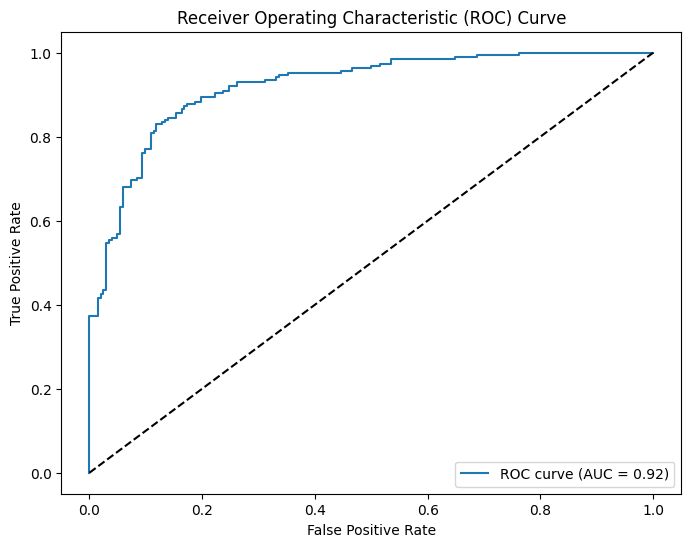

In [95]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

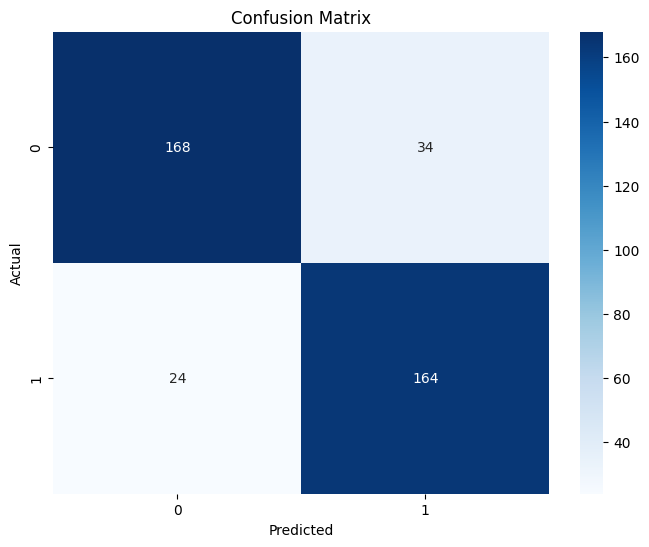

In [96]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [97]:
## sm package 로 모델링 시행한 버전

# 종속 변수와 독립 변수를 결합한 데이터 프레임 생성
X_train = sm.add_constant(X_train)  # 상수항 추가
logit_model = sm.Logit(y_train, X_train)  # 로지스틱 회귀 모델 생성

# 모델 학습
result = logit_model.fit()

# 결과 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.371257
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:         Anx_group_base   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1553
Method:                           MLE   Df Model:                            5
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.4644
Time:                        17:19:12   Log-Likelihood:                -578.79
converged:                       True   LL-Null:                       -1080.5
Covariance Type:            nonrobust   LLR p-value:                1.044e-214
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2528      0.079      3.194      0.001       0.098       0.408
PHQ9           1.4954      0.

### logistic regression - demo X + follow up GAD

In [98]:
# demo 변수 불포함 + follow up GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [99]:
# VIF 계산

vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)

  Feature       VIF
0    PHQ9  1.731240
1     IUS  1.585029
2     CFI  1.521414
3    DERS  2.622673
4      DO  1.806588


In [100]:
# 로지스틱 회귀 모델 생성
logreg = LogisticRegression()

# 모델 학습
logreg.fit(X_train, y_train)

# 예측
y_pred = logreg.predict(X_test)
y_prob = logreg.predict_proba(X_test)[:, 1]

print(result.summary())

                           Logit Regression Results                           
Dep. Variable:         Anx_group_base   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1553
Method:                           MLE   Df Model:                            5
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.4644
Time:                        17:21:44   Log-Likelihood:                -578.79
converged:                       True   LL-Null:                       -1080.5
Covariance Type:            nonrobust   LLR p-value:                1.044e-214
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2528      0.079      3.194      0.001       0.098       0.408
PHQ9           1.4954      0.120     12.448      0.000       1.260       1.731
IUS            0.5799      0.092      6.301      0.0

In [101]:
# 변수 중요도 확인

coefficients = pd.DataFrame(logreg.coef_.T, X.columns, columns=['Coefficient'])
print(coefficients)

      Coefficient
PHQ9     0.823219
IUS      0.350959
CFI     -0.063713
DERS     0.502689
DO       0.443537


In [102]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.78
Precision: 0.82
Recall: 0.73
F1 Score: 0.77
AUC: 0.85


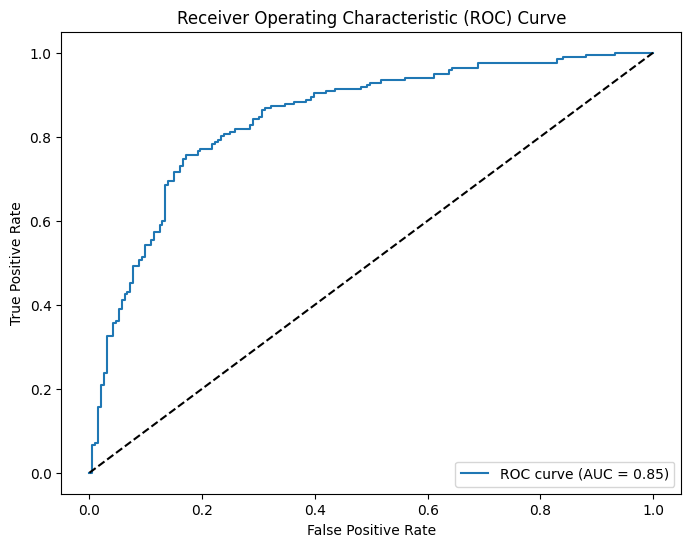

In [103]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

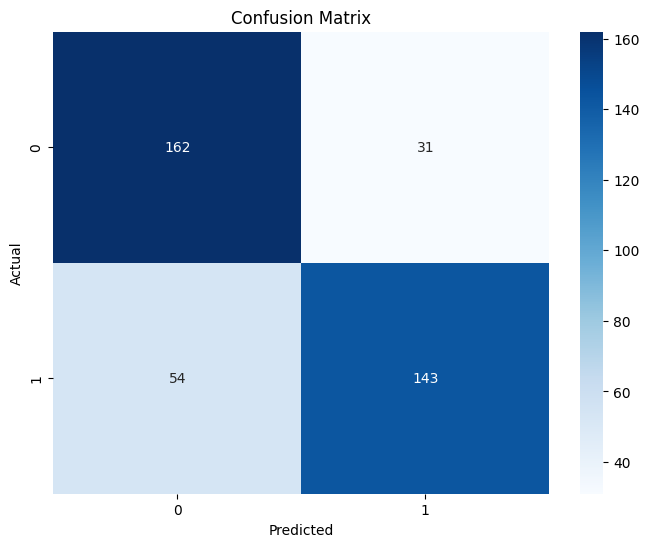

In [104]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [105]:
## sm package 로 모델링 시행한 버전

# 종속 변수와 독립 변수를 결합한 데이터 프레임 생성
X_train = sm.add_constant(X_train)  # 상수항 추가
logit_model = sm.Logit(y_train, X_train)  # 로지스틱 회귀 모델 생성

# 모델 학습
result = logit_model.fit()

# 결과 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.476338
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:           Anx_group_fu   No. Observations:                 1559
Model:                          Logit   Df Residuals:                     1553
Method:                           MLE   Df Model:                            5
Date:                Thu, 01 Aug 2024   Pseudo R-squ.:                  0.3114
Time:                        17:22:50   Log-Likelihood:                -742.61
converged:                       True   LL-Null:                       -1078.4
Covariance Type:            nonrobust   LLR p-value:                6.811e-143
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0894      0.065     -1.370      0.171      -0.217       0.039
PHQ9           0.8273      0.

### random forest - demo O + baseline GAD

In [27]:
from sklearn.ensemble import RandomForestClassifier
from pprint import pprint
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [67]:
# demo 변수 포함 + baseline GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [68]:
# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

In [69]:
for test, pred in zip(y_test, y_pred):
    print(f"TEST: {test} / PRED: {pred}")

TEST: 0 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / 

In [ ]:
# # XGBoost DMatrix로 변환
# train_dmatrix = xgb.DMatrix(X_train, label=y_train)
# test_dmatrix = xgb.DMatrix(X_test, label=y_test)

In [ ]:
# # 랜덤 포레스트 모델 설정
# params = {
#     'objective': 'binary:logistic',
#     'max_depth': 10,
#     'eta': 0.1,
#     'subsample': 0.8,
#     'colsample_bytree': 0.8,
#     'num_parallel_tree': 100,  # 랜덤 포레스트의 트리 수
#     'tree_method': 'hist'  # 대규모 데이터셋을 위한 히스토그램 기반 방법
# }

In [ ]:
# # 모델 학습
# rf_model = xgb.train(params, train_dmatrix, num_boost_round=10)

# # 예측
# y_pred_prob = rf_model.predict(test_dmatrix)
# y_pred = (y_pred_prob > 0.5).astype(int)

In [70]:
# 평가 
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

display(accuracy)
display(conf_matrix)
pprint(class_report)

0.8358974358974359

array([[166,  36],
       [ 28, 160]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.86      0.82      0.84       202\n'
 '           1       0.82      0.85      0.83       188\n'
 '\n'
 '    accuracy                           0.84       390\n'
 '   macro avg       0.84      0.84      0.84       390\n'
 'weighted avg       0.84      0.84      0.84       390\n')


In [71]:
# 하이퍼파라미터 GridSearch로 최적화
# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# GridSearchCV를 사용하여 하이퍼파라미터 최적화
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# 최적의 모델로 다시 학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 세트로 예측
y_pred_best = best_model.predict(X_test)

# 모델 성능 평가
accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

display(accuracy_best)
display(conf_matrix_best)
pprint(class_report_best)

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1

0.841025641025641

array([[168,  34],
       [ 28, 160]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.86      0.83      0.84       202\n'
 '           1       0.82      0.85      0.84       188\n'
 '\n'
 '    accuracy                           0.84       390\n'
 '   macro avg       0.84      0.84      0.84       390\n'
 'weighted avg       0.84      0.84      0.84       390\n')


In [72]:
# feature importance 반영

# 특성 중요도 확인
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# 중요도 기준으로 정렬
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# 중요한 특성만 선택하여 다시 학습
top_features = feature_importance_df.head(10)['Feature']
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_top = RandomForestClassifier(random_state=42)
model_top.fit(X_train_top, y_train)
y_pred_top = model_top.predict(X_test_top)

accuracy_top = accuracy_score(y_test, y_pred_top)
conf_matrix_top = confusion_matrix(y_test, y_pred_top)
class_report_top = classification_report(y_test, y_pred_top)

display(accuracy_top)
display(conf_matrix_top)
pprint(class_report_top)

     Feature  Importance
3       PHQ9    0.250860
7         DO    0.186856
6       DERS    0.183616
4        IUS    0.147389
5        CFI    0.115789
0        age    0.059229
2        SES    0.036986
1  education    0.019274


0.8333333333333334

array([[165,  37],
       [ 28, 160]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.85      0.82      0.84       202\n'
 '           1       0.81      0.85      0.83       188\n'
 '\n'
 '    accuracy                           0.83       390\n'
 '   macro avg       0.83      0.83      0.83       390\n'
 'weighted avg       0.83      0.83      0.83       390\n')


In [73]:
# 교차 검증을 통해서 안정성 올리기

# 교차 검증을 사용하여 best_model 성능 평가

cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# 교차 검증을 사용하여 model_top 성능 평가

cv_scores = cross_val_score(model_top, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.78974359 0.82820513 0.85897436 0.82307692 0.781491  ]
Mean Accuracy: 0.8162982005141387
Cross-Validation Scores: [0.7974359  0.81025641 0.85641026 0.81538462 0.80205656]
Mean Accuracy: 0.8163087469514204


### random forest - demo O + follow up GAD

In [106]:
# demo 변수 포함 + follow up GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [107]:
# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

In [108]:
for test, pred in zip(y_test, y_pred):
    print(f"TEST: {test} / PRED: {pred}")

TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / 

In [109]:
# 평가 
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

display(accuracy)
display(conf_matrix)
pprint(class_report)

0.7512820512820513

array([[153,  40],
       [ 57, 140]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.73      0.79      0.76       193\n'
 '           1       0.78      0.71      0.74       197\n'
 '\n'
 '    accuracy                           0.75       390\n'
 '   macro avg       0.75      0.75      0.75       390\n'
 'weighted avg       0.75      0.75      0.75       390\n')


In [110]:
# 하이퍼파라미터 GridSearch로 최적화
# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# GridSearchCV를 사용하여 하이퍼파라미터 최적화
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# 최적의 모델로 다시 학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 세트로 예측
y_pred_best = best_model.predict(X_test)

# 모델 성능 평가
accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

display(accuracy_best)
display(conf_matrix_best)
pprint(class_report_best)

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=2

0.7743589743589744

array([[152,  41],
       [ 47, 150]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.76      0.79      0.78       193\n'
 '           1       0.79      0.76      0.77       197\n'
 '\n'
 '    accuracy                           0.77       390\n'
 '   macro avg       0.77      0.77      0.77       390\n'
 'weighted avg       0.77      0.77      0.77       390\n')


In [111]:
# feature importance 반영

# 특성 중요도 확인
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# 중요도 기준으로 정렬
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# 중요한 특성만 선택하여 다시 학습
top_features = feature_importance_df.head(10)['Feature']
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_top = RandomForestClassifier(random_state=42)
model_top.fit(X_train_top, y_train)
y_pred_top = model_top.predict(X_test_top)

accuracy_top = accuracy_score(y_test, y_pred_top)
conf_matrix_top = confusion_matrix(y_test, y_pred_top)
class_report_top = classification_report(y_test, y_pred_top)

display(accuracy_top)
display(conf_matrix_top)
pprint(class_report_top)

     Feature  Importance
3       PHQ9    0.213436
7         DO    0.189699
6       DERS    0.184911
4        IUS    0.136895
5        CFI    0.125575
0        age    0.078707
2        SES    0.047478
1  education    0.023298


0.7564102564102564

array([[153,  40],
       [ 55, 142]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.74      0.79      0.76       193\n'
 '           1       0.78      0.72      0.75       197\n'
 '\n'
 '    accuracy                           0.76       390\n'
 '   macro avg       0.76      0.76      0.76       390\n'
 'weighted avg       0.76      0.76      0.76       390\n')


In [112]:
# 교차 검증을 통해서 안정성 올리기

# 교차 검증을 사용하여 best_model 성능 평가

cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# 교차 검증을 사용하여 model_top 성능 평가

cv_scores = cross_val_score(model_top, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.76153846 0.74615385 0.80512821 0.78717949 0.79177378]
Mean Accuracy: 0.7783547557840617
Cross-Validation Scores: [0.76666667 0.76666667 0.79487179 0.7974359  0.80462725]
Mean Accuracy: 0.7860536549996705


### random forest - demo O + followup GAD + current ANX

In [43]:
# demo 변수 포함 + follow up GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO', 'GAD_base']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [44]:
# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

In [45]:
for test, pred in zip(y_test, y_pred):
    print(f"TEST: {test} / PRED: {pred}")

TEST: 1 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / 

In [46]:
# 평가 
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

display(accuracy)
display(conf_matrix)
pprint(class_report)

0.7897435897435897

array([[156,  37],
       [ 45, 152]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.78      0.81      0.79       193\n'
 '           1       0.80      0.77      0.79       197\n'
 '\n'
 '    accuracy                           0.79       390\n'
 '   macro avg       0.79      0.79      0.79       390\n'
 'weighted avg       0.79      0.79      0.79       390\n')


In [47]:
# 하이퍼파라미터 GridSearch로 최적화
# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# GridSearchCV를 사용하여 하이퍼파라미터 최적화
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# 최적의 모델로 다시 학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 세트로 예측
y_pred_best = best_model.predict(X_test)

# 모델 성능 평가
accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

display(accuracy_best)
display(conf_matrix_best)
pprint(class_report_best)

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1

0.8

array([[156,  37],
       [ 41, 156]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.79      0.81      0.80       193\n'
 '           1       0.81      0.79      0.80       197\n'
 '\n'
 '    accuracy                           0.80       390\n'
 '   macro avg       0.80      0.80      0.80       390\n'
 'weighted avg       0.80      0.80      0.80       390\n')


In [48]:
# feature importance 반영

# 특성 중요도 확인
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# 중요도 기준으로 정렬
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# 중요한 특성만 선택하여 다시 학습
top_features = feature_importance_df.head(10)['Feature']
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_top = RandomForestClassifier(random_state=42)
model_top.fit(X_train_top, y_train)
y_pred_top = model_top.predict(X_test_top)

accuracy_top = accuracy_score(y_test, y_pred_top)
conf_matrix_top = confusion_matrix(y_test, y_pred_top)
class_report_top = classification_report(y_test, y_pred_top)

display(accuracy_top)
display(conf_matrix_top)
pprint(class_report_top)

     Feature  Importance
8   GAD_base    0.221036
3       PHQ9    0.165968
7         DO    0.158277
6       DERS    0.132899
4        IUS    0.107643
5        CFI    0.095295
0        age    0.062873
2        SES    0.037880
1  education    0.018129


0.7948717948717948

array([[159,  34],
       [ 46, 151]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.78      0.82      0.80       193\n'
 '           1       0.82      0.77      0.79       197\n'
 '\n'
 '    accuracy                           0.79       390\n'
 '   macro avg       0.80      0.80      0.79       390\n'
 'weighted avg       0.80      0.79      0.79       390\n')


In [49]:
# 교차 검증을 통해서 안정성 올리기

# 교차 검증을 사용하여 best_model 성능 평가

cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# 교차 검증을 사용하여 model_top 성능 평가

cv_scores = cross_val_score(model_top, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.77179487 0.77435897 0.81538462 0.8        0.83290488]
Mean Accuracy: 0.7988886691714455
Cross-Validation Scores: [0.77435897 0.76410256 0.81282051 0.8        0.82262211]
Mean Accuracy: 0.7947808318502405


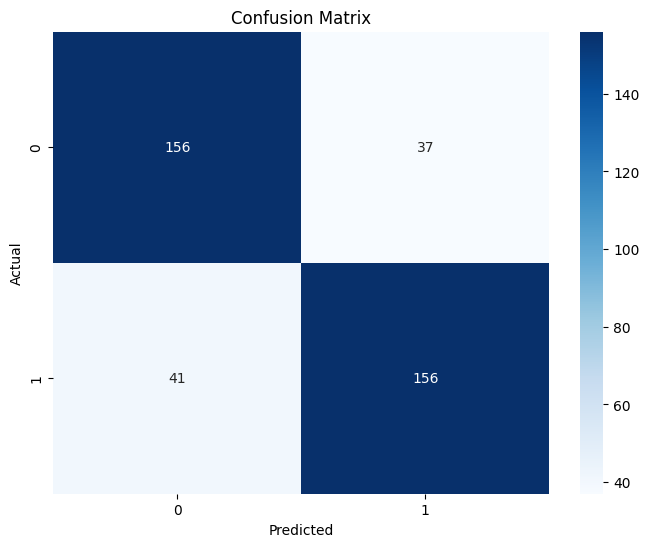

In [51]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred_best)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### random forest - demo X + baseline GAD

In [113]:
# demo 변수 불포함 + baseline GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [114]:
# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

In [115]:
for test, pred in zip(y_test, y_pred):
    print(f"TEST: {test} / PRED: {pred}")

TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / 

In [116]:
# 평가 
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

display(accuracy)
display(conf_matrix)
pprint(class_report)

0.8333333333333334

array([[166,  36],
       [ 29, 159]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.85      0.82      0.84       202\n'
 '           1       0.82      0.85      0.83       188\n'
 '\n'
 '    accuracy                           0.83       390\n'
 '   macro avg       0.83      0.83      0.83       390\n'
 'weighted avg       0.83      0.83      0.83       390\n')


In [117]:
# 하이퍼파라미터 GridSearch로 최적화
# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# GridSearchCV를 사용하여 하이퍼파라미터 최적화
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# 최적의 모델로 다시 학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 세트로 예측
y_pred_best = best_model.predict(X_test)

# 모델 성능 평가
accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

display(accuracy_best)
display(conf_matrix_best)
pprint(class_report_best)

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1

0.8307692307692308

array([[166,  36],
       [ 30, 158]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.85      0.82      0.83       202\n'
 '           1       0.81      0.84      0.83       188\n'
 '\n'
 '    accuracy                           0.83       390\n'
 '   macro avg       0.83      0.83      0.83       390\n'
 'weighted avg       0.83      0.83      0.83       390\n')


In [118]:
# feature importance 반영

# 특성 중요도 확인
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# 중요도 기준으로 정렬
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# 중요한 특성만 선택하여 다시 학습
top_features = feature_importance_df.head(10)['Feature']
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_top = RandomForestClassifier(random_state=42)
model_top.fit(X_train_top, y_train)
y_pred_top = model_top.predict(X_test_top)

accuracy_top = accuracy_score(y_test, y_pred_top)
conf_matrix_top = confusion_matrix(y_test, y_pred_top)
class_report_top = classification_report(y_test, y_pred_top)

display(accuracy_top)
display(conf_matrix_top)
pprint(class_report_top)

  Feature  Importance
0    PHQ9    0.312252
3    DERS    0.217247
4      DO    0.198808
1     IUS    0.150246
2     CFI    0.121446


0.8384615384615385

array([[168,  34],
       [ 29, 159]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.85      0.83      0.84       202\n'
 '           1       0.82      0.85      0.83       188\n'
 '\n'
 '    accuracy                           0.84       390\n'
 '   macro avg       0.84      0.84      0.84       390\n'
 'weighted avg       0.84      0.84      0.84       390\n')


In [119]:
# 교차 검증을 통해서 안정성 올리기

# 교차 검증을 사용하여 best_model 성능 평가

cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# 교차 검증을 사용하여 model_top 성능 평가

cv_scores = cross_val_score(model_top, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.80769231 0.82051282 0.86153846 0.81794872 0.78920308]
Mean Accuracy: 0.8193790785050424
Cross-Validation Scores: [0.7974359  0.80769231 0.85641026 0.80512821 0.77120823]
Mean Accuracy: 0.8075749785775492


### random forest - demo X + follow up GAD

In [9]:
# demo 변수 불포함 + follow up GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

In [13]:
for test, pred in zip(y_test, y_pred):
    print(f"TEST: {test} / PRED: {pred}")

TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / 

In [26]:
# 평가 
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

display(accuracy)
display(conf_matrix)
pprint(class_report)

0.7717948717948718

array([[153,  40],
       [ 49, 148]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.76      0.79      0.77       193\n'
 '           1       0.79      0.75      0.77       197\n'
 '\n'
 '    accuracy                           0.77       390\n'
 '   macro avg       0.77      0.77      0.77       390\n'
 'weighted avg       0.77      0.77      0.77       390\n')


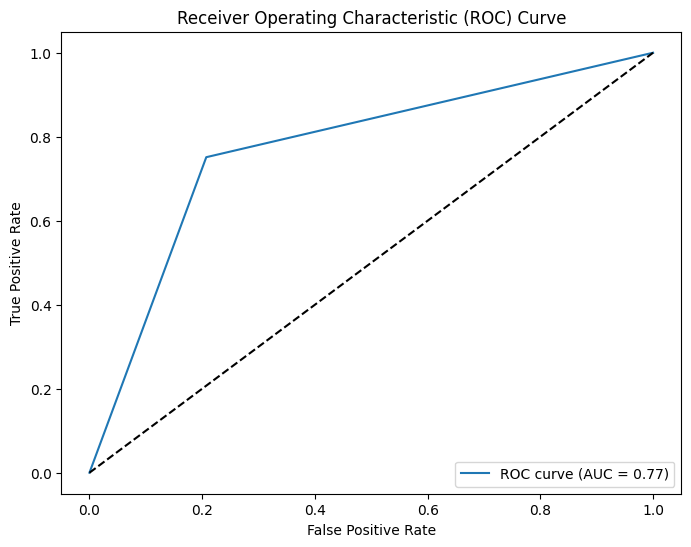

In [31]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

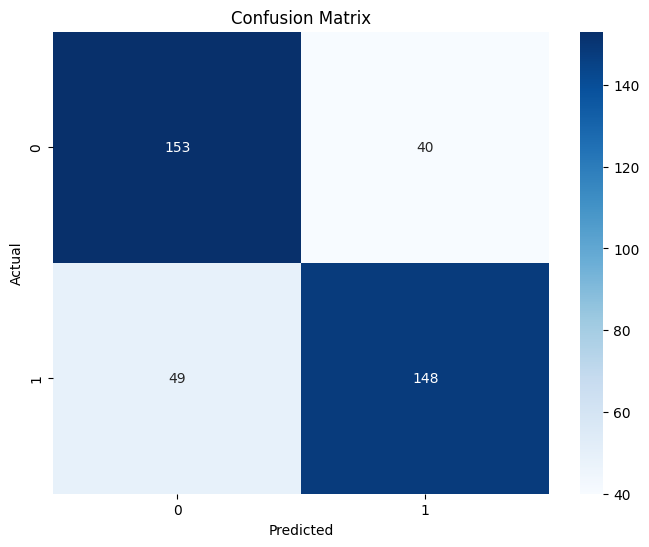

In [36]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [124]:
# 하이퍼파라미터 GridSearch로 최적화
# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# GridSearchCV를 사용하여 하이퍼파라미터 최적화
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# 최적의 모델로 다시 학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 세트로 예측
y_pred_best = best_model.predict(X_test)

# 모델 성능 평가
accuracy_best = accuracy_score(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)
class_report_best = classification_report(y_test, y_pred_best)

display(accuracy_best)
display(conf_matrix_best)
pprint(class_report_best)

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=2

0.7666666666666667

array([[151,  42],
       [ 49, 148]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.76      0.78      0.77       193\n'
 '           1       0.78      0.75      0.76       197\n'
 '\n'
 '    accuracy                           0.77       390\n'
 '   macro avg       0.77      0.77      0.77       390\n'
 'weighted avg       0.77      0.77      0.77       390\n')


In [125]:
# feature importance 반영

# 특성 중요도 확인
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# 중요도 기준으로 정렬
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# 중요한 특성만 선택하여 다시 학습
top_features = feature_importance_df.head(10)['Feature']
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_top = RandomForestClassifier(random_state=42)
model_top.fit(X_train_top, y_train)
y_pred_top = model_top.predict(X_test_top)

accuracy_top = accuracy_score(y_test, y_pred_top)
conf_matrix_top = confusion_matrix(y_test, y_pred_top)
class_report_top = classification_report(y_test, y_pred_top)

display(accuracy_top)
display(conf_matrix_top)
pprint(class_report_top)

  Feature  Importance
0    PHQ9    0.254460
3    DERS    0.221767
4      DO    0.221120
1     IUS    0.160729
2     CFI    0.141924


0.7538461538461538

array([[150,  43],
       [ 53, 144]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.74      0.78      0.76       193\n'
 '           1       0.77      0.73      0.75       197\n'
 '\n'
 '    accuracy                           0.75       390\n'
 '   macro avg       0.75      0.75      0.75       390\n'
 'weighted avg       0.75      0.75      0.75       390\n')


In [126]:
# 교차 검증을 통해서 안정성 올리기

# 교차 검증을 사용하여 best_model 성능 평가

cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# 교차 검증을 사용하여 model_top 성능 평가

cv_scores = cross_val_score(model_top, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.75897436 0.75641026 0.80512821 0.77692308 0.79434447]
Mean Accuracy: 0.7783560740887218
Cross-Validation Scores: [0.76153846 0.73846154 0.8        0.75897436 0.79948586]
Mean Accuracy: 0.7716920440313756


### random forest - demo X + followup GAD + current ANX

In [147]:
# demo 변수 포함 + follow up GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO', 'GAD_base']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [148]:
# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

In [149]:
for test, pred in zip(y_test, y_pred):
    print(f"TEST: {test} / PRED: {pred}")

TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 1 / PRED: 1
TEST: 0 / PRED: 1
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 0 / PRED: 0
TEST: 1 / PRED: 0
TEST: 1 / PRED: 1
TEST: 1 / 

In [150]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.83      0.81       193
           1       0.83      0.77      0.80       197

    accuracy                           0.80       390
   macro avg       0.80      0.80      0.80       390
weighted avg       0.80      0.80      0.80       390



In [152]:
# 하이퍼파라미터 GridSearch로 최적화
# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# GridSearchCV를 사용하여 하이퍼파라미터 최적화
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# 최적의 모델로 다시 학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 세트로 예측
y_pred_best = best_model.predict(X_test)

# 모델 성능 평가
print(classification_report(y_test, y_pred_best))

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1

In [153]:
# feature importance 반영

# 특성 중요도 확인
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# 중요도 기준으로 정렬
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# 중요한 특성만 선택하여 다시 학습
top_features = feature_importance_df.head(10)['Feature']
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_top = RandomForestClassifier(random_state=42)
model_top.fit(X_train_top, y_train)
y_pred_top = model_top.predict(X_test_top)

accuracy_top = accuracy_score(y_test, y_pred_top)
conf_matrix_top = confusion_matrix(y_test, y_pred_top)
class_report_top = classification_report(y_test, y_pred_top)

display(accuracy_top)
display(conf_matrix_top)
pprint(class_report_top)

    Feature  Importance
5  GAD_base    0.242445
0      PHQ9    0.187924
4        DO    0.165822
3      DERS    0.162905
1       IUS    0.125969
2       CFI    0.114934


0.7897435897435897

array([[156,  37],
       [ 45, 152]])

('              precision    recall  f1-score   support\n'
 '\n'
 '           0       0.78      0.81      0.79       193\n'
 '           1       0.80      0.77      0.79       197\n'
 '\n'
 '    accuracy                           0.79       390\n'
 '   macro avg       0.79      0.79      0.79       390\n'
 'weighted avg       0.79      0.79      0.79       390\n')


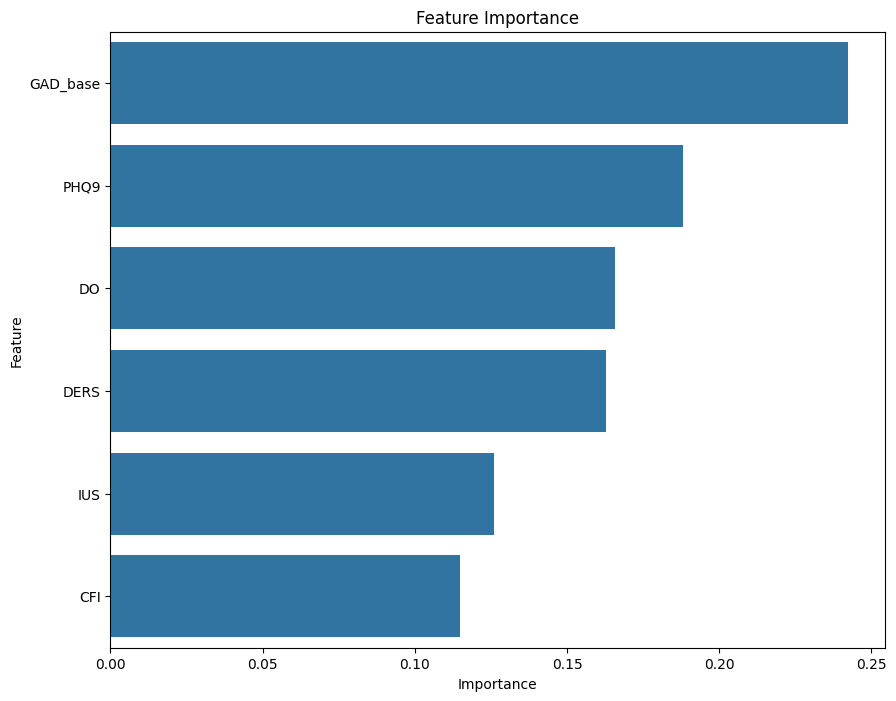

In [154]:
# feature importance 시각화

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.show()


In [58]:
# 교차 검증을 통해서 안정성 올리기

# 교차 검증을 사용하여 best_model 성능 평가

cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

# 교차 검증을 사용하여 model_top 성능 평가

cv_scores = cross_val_score(model_top, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.78717949 0.78205128 0.81538462 0.7974359  0.82262211]
Mean Accuracy: 0.8009346780040868
Cross-Validation Scores: [0.75641026 0.77179487 0.82307692 0.8        0.82005141]
Mean Accuracy: 0.7942666930327598


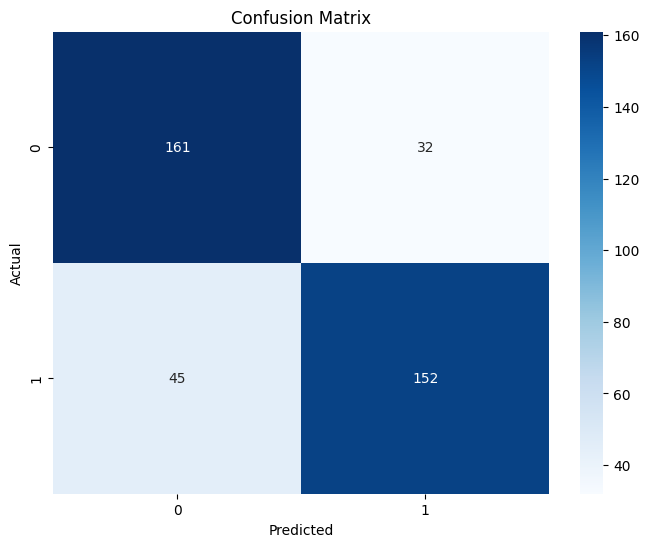

In [155]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### SVM - demo O + baseline GAD

In [28]:
from sklearn.svm import SVC
from skopt import BayesSearchCV

In [169]:
# demo 변수 포함 + baseline GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [130]:
# SVM 모델 학습
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [131]:
# 예측 및 평가
y_pred = svm_model.predict(X_test)

In [132]:
# 평가 결과 출력
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.85      0.86       202
           1       0.84      0.86      0.85       188

    accuracy                           0.85       390
   macro avg       0.85      0.85      0.85       390
weighted avg       0.85      0.85      0.85       390



In [133]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')
print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.85
Precision: 0.84
Recall: 0.86
F1 Score: 0.85
AUC: 0.92


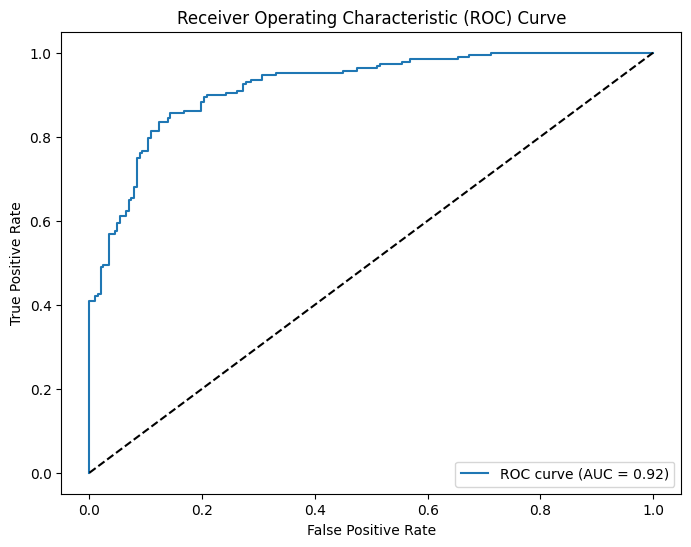

In [134]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

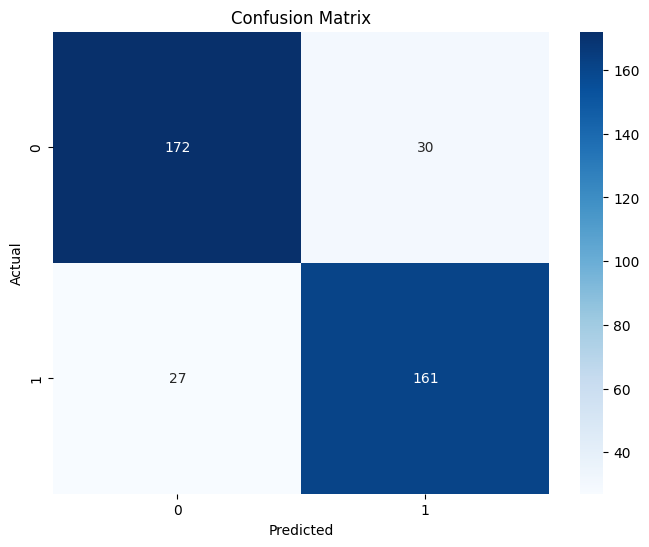

In [135]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [170]:
# Bayesian Optimization
param_space = {
    'C': (0.1, 100.0, 'log-uniform'),  # 0.1에서 100 사이의 로그 균등 분포
    'gamma': (0.001, 1.0, 'log-uniform'),  # 0.001에서 1 사이의 로그 균등 분포
    'kernel': ['linear', 'rbf', 'poly']  # 커널 함수의 후보
}

bayes_search = BayesSearchCV(SVC(), param_space, n_iter=32, cv=5, verbose=2, random_state=42)
bayes_search.fit(X_train, y_train)

print(bayes_search.best_params_)
grid_predictions = bayes_search.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; t

In [171]:
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       202
           1       0.81      0.85      0.83       188

    accuracy                           0.83       390
   macro avg       0.83      0.83      0.83       390
weighted avg       0.83      0.83      0.83       390



In [172]:
# F1 score - grid_predictions
accuracy = accuracy_score(y_test, grid_predictions)
precision = precision_score(y_test, grid_predictions)
recall = recall_score(y_test, grid_predictions)
f1 = f1_score(y_test, grid_predictions)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.83
Precision: 0.81
Recall: 0.85
F1 Score: 0.83
AUC: 0.92


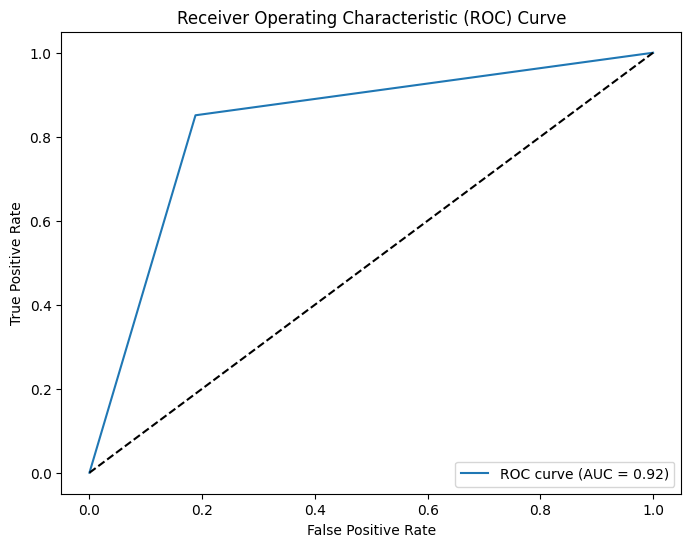

In [173]:
# ROC curve - grid_predictions
fpr, tpr, thresholds = roc_curve(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

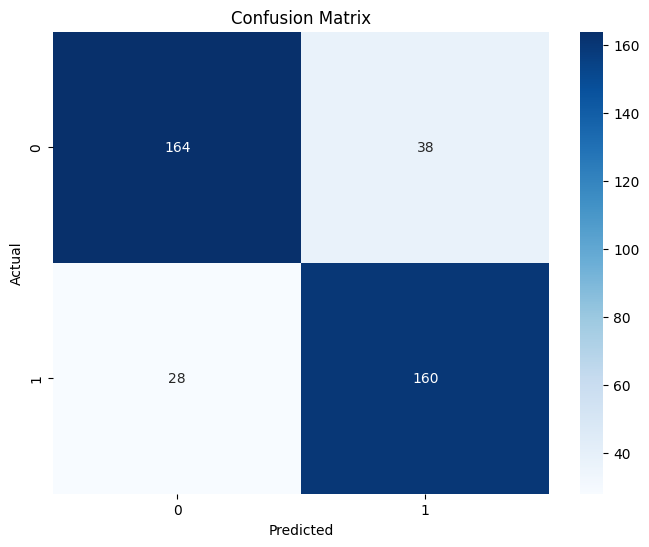

In [174]:
# 혼동 행렬 - grid_predictions
cm = confusion_matrix(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### SVM - demo O + follow up GAD

In [176]:
# demo 변수 포함 + follow up GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [137]:
# SVM 모델 학습
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [138]:
# 예측 및 평가
y_pred = svm_model.predict(X_test)

In [139]:
# 평가 결과 출력
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.74      0.83      0.79       193
           1       0.82      0.72      0.76       197

    accuracy                           0.77       390
   macro avg       0.78      0.77      0.77       390
weighted avg       0.78      0.77      0.77       390



In [140]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.77
Precision: 0.82
Recall: 0.72
F1 Score: 0.76
AUC: 0.85


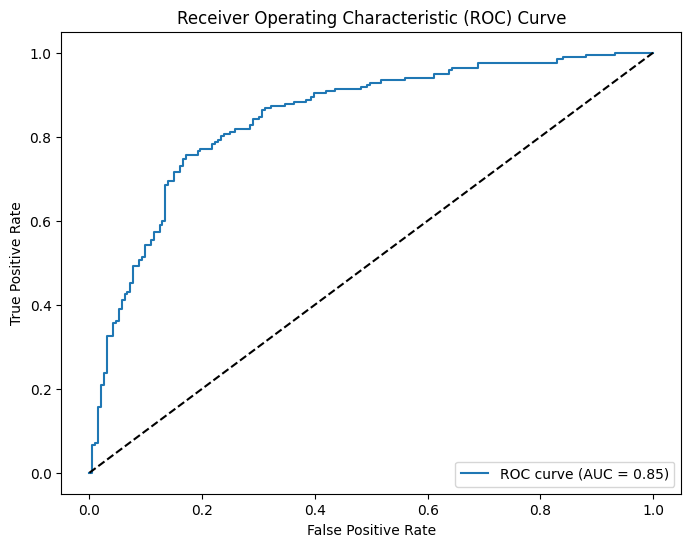

In [141]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

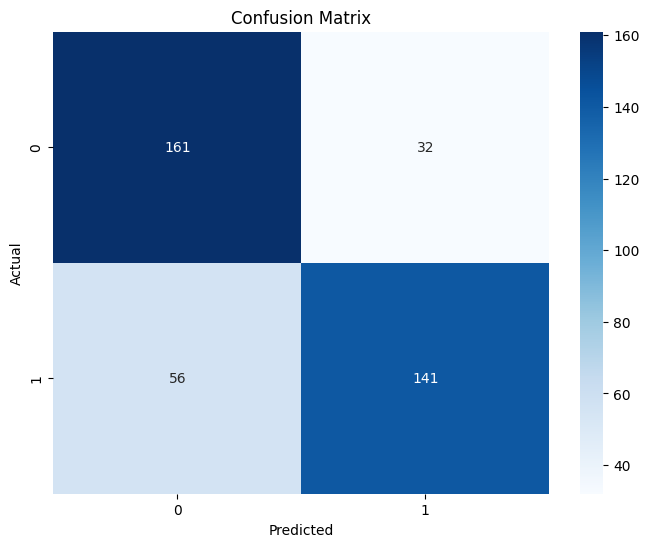

In [142]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [177]:
# Bayesian Optimization
param_space = {
    'C': (0.1, 100.0, 'log-uniform'),  # 0.1에서 100 사이의 로그 균등 분포
    'gamma': (0.001, 1.0, 'log-uniform'),  # 0.001에서 1 사이의 로그 균등 분포
    'kernel': ['linear', 'rbf', 'poly']  # 커널 함수의 후보
}

bayes_search = BayesSearchCV(SVC(), param_space, n_iter=32, cv=5, verbose=2, random_state=42)
bayes_search.fit(X_train, y_train)

print(bayes_search.best_params_)
grid_predictions = bayes_search.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; t

In [178]:
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.74      0.83      0.78       193
           1       0.81      0.72      0.76       197

    accuracy                           0.77       390
   macro avg       0.78      0.77      0.77       390
weighted avg       0.78      0.77      0.77       390



In [179]:
# F1 score - grid_predictions
accuracy = accuracy_score(y_test, grid_predictions)
precision = precision_score(y_test, grid_predictions)
recall = recall_score(y_test, grid_predictions)
f1 = f1_score(y_test, grid_predictions)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.77
Precision: 0.81
Recall: 0.72
F1 Score: 0.76
AUC: 0.85


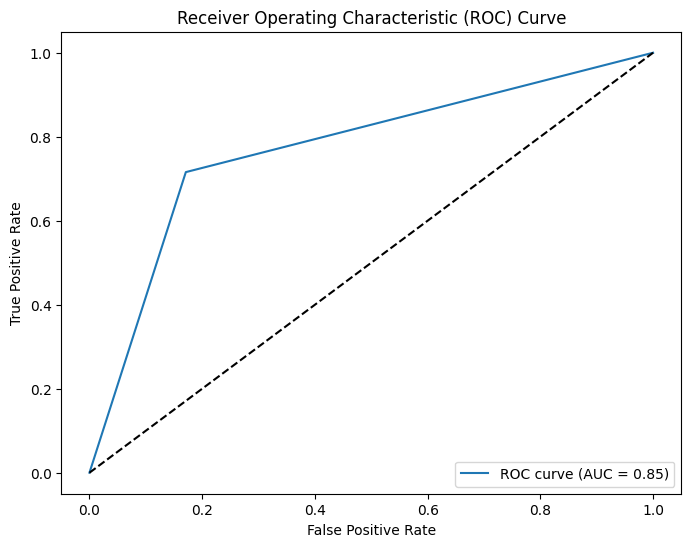

In [180]:
# ROC curve - grid_predictions
fpr, tpr, thresholds = roc_curve(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

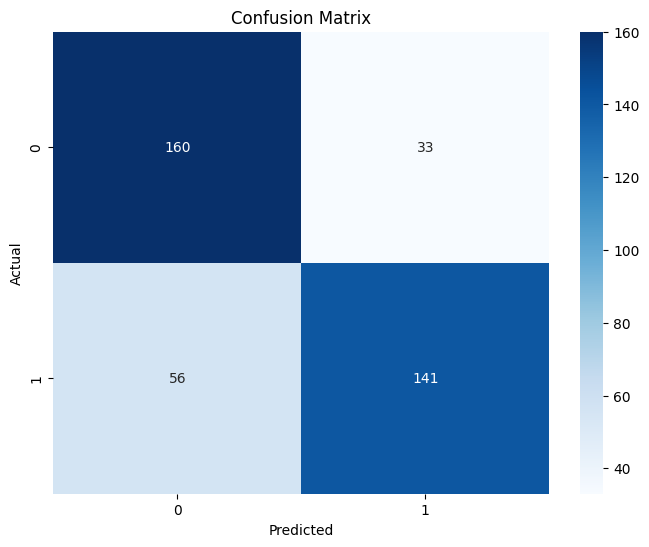

In [181]:
# 혼동 행렬 - grid_predictions
cm = confusion_matrix(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### SVM - demo O + followup GAD + current ANX

In [60]:
# demo 변수 포함 + follow up GAD 분류

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO', 'GAD_base']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [61]:
# SVM 모델 학습
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [62]:
# 예측 및 평가
y_pred = svm_model.predict(X_test)

# 평가 결과 출력
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.74      0.85      0.79       193
           1       0.83      0.71      0.77       197

    accuracy                           0.78       390
   macro avg       0.79      0.78      0.78       390
weighted avg       0.79      0.78      0.78       390



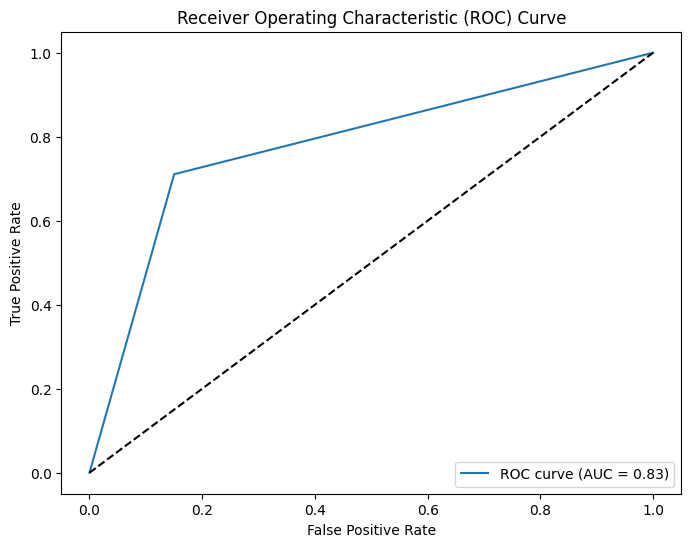

In [64]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

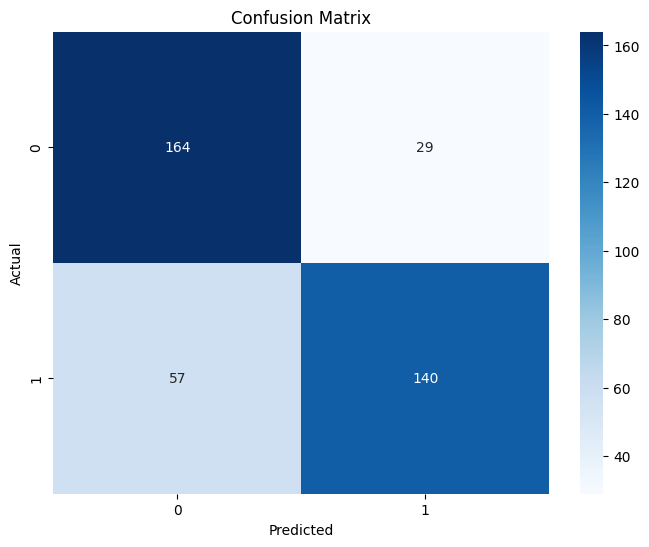

In [65]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [66]:
# Bayesian Optimization
param_space = {
    'C': (0.1, 100.0, 'log-uniform'),  # 0.1에서 100 사이의 로그 균등 분포
    'gamma': (0.001, 1.0, 'log-uniform'),  # 0.001에서 1 사이의 로그 균등 분포
    'kernel': ['linear', 'rbf', 'poly']  # 커널 함수의 후보
}

bayes_search = BayesSearchCV(SVC(), param_space, n_iter=32, cv=5, verbose=2, random_state=42)
bayes_search.fit(X_train, y_train)

print(bayes_search.best_params_)
grid_predictions = bayes_search.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.1s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.2s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; t

In [67]:
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.78      0.82      0.80       193
           1       0.81      0.78      0.79       197

    accuracy                           0.80       390
   macro avg       0.80      0.80      0.80       390
weighted avg       0.80      0.80      0.80       390



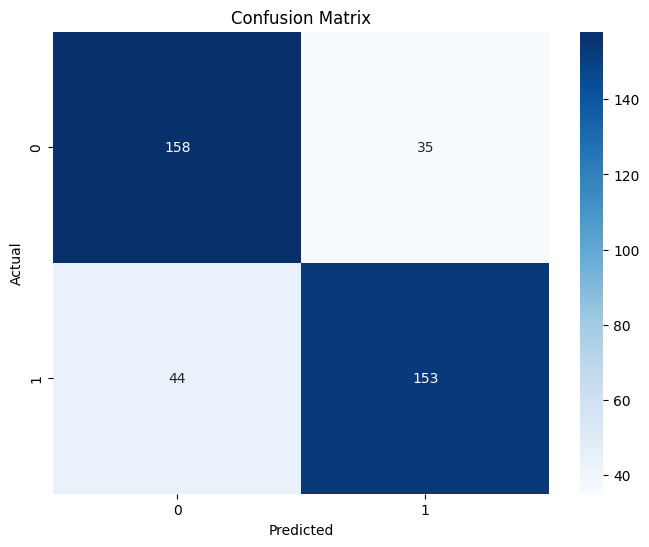

In [68]:
# 혼동 행렬 - grid_predictions
cm = confusion_matrix(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### SVM - demo X + baseline GAD

In [201]:
# demo 변수 불포함 + baseline GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [144]:
# SVM 모델 학습
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [145]:
# 예측 및 평가
y_pred = svm_model.predict(X_test)

In [146]:
# 평가 결과 출력
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.82      0.84       202
           1       0.82      0.87      0.84       188

    accuracy                           0.84       390
   macro avg       0.84      0.84      0.84       390
weighted avg       0.85      0.84      0.84       390



In [147]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.84
Precision: 0.82
Recall: 0.87
F1 Score: 0.84
AUC: 0.92


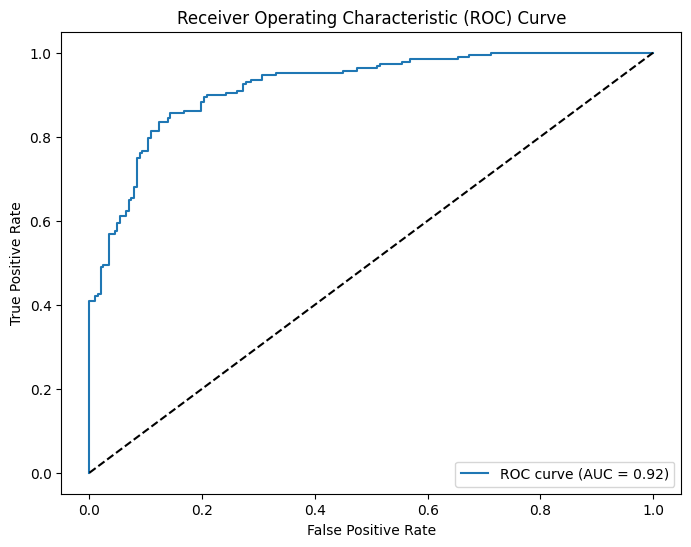

In [148]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

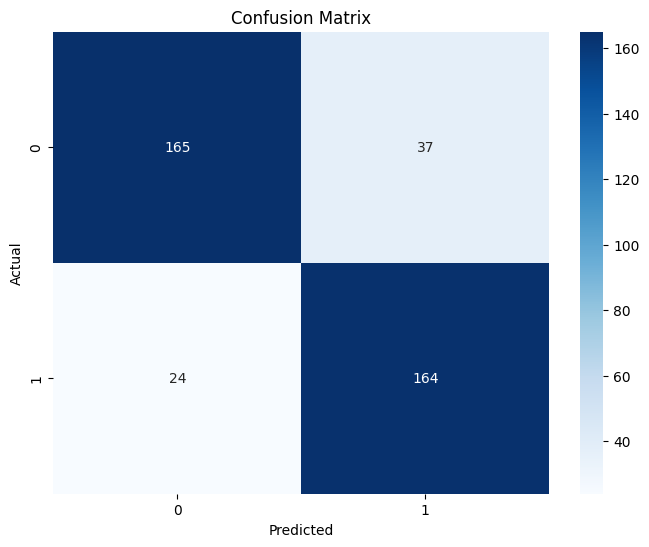

In [149]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [183]:
# Bayesian Optimization
param_space = {
    'C': (0.1, 100.0, 'log-uniform'),  # 0.1에서 100 사이의 로그 균등 분포
    'gamma': (0.001, 1.0, 'log-uniform'),  # 0.001에서 1 사이의 로그 균등 분포
    'kernel': ['linear', 'rbf', 'poly']  # 커널 함수의 후보
}

bayes_search = BayesSearchCV(SVC(), param_space, n_iter=32, cv=5, verbose=2, random_state=42)
bayes_search.fit(X_train, y_train)

print(bayes_search.best_params_)
grid_predictions = bayes_search.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; t

In [184]:
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.87      0.82      0.84       202
           1       0.82      0.87      0.84       188

    accuracy                           0.84       390
   macro avg       0.84      0.84      0.84       390
weighted avg       0.85      0.84      0.84       390



In [185]:
# F1 score - grid_predictions
accuracy = accuracy_score(y_test, grid_predictions)
precision = precision_score(y_test, grid_predictions)
recall = recall_score(y_test, grid_predictions)
f1 = f1_score(y_test, grid_predictions)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.84
Precision: 0.82
Recall: 0.87
F1 Score: 0.84
AUC: 0.92


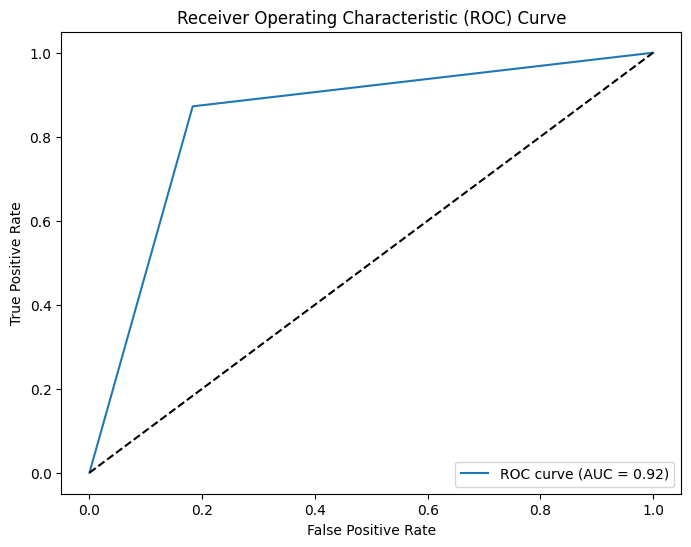

In [186]:
# ROC curve - grid_predictions
fpr, tpr, thresholds = roc_curve(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

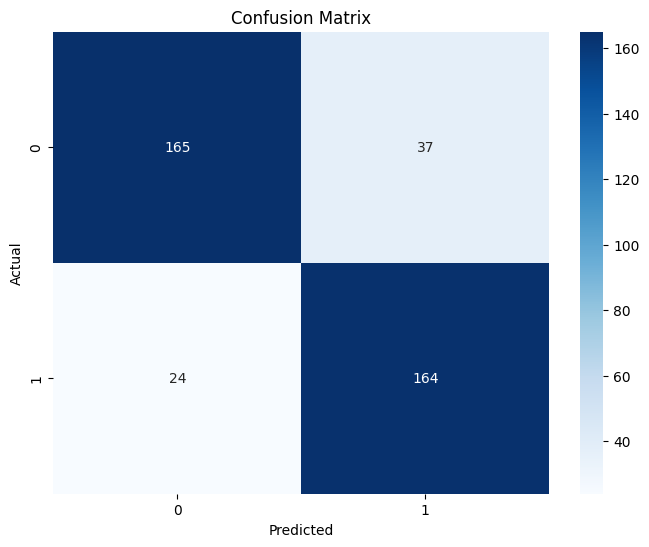

In [187]:
# 혼동 행렬 - grid_predictions
cm = confusion_matrix(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### SVM - demo X + follow up GAD

In [188]:
# demo 변수 불포함 + follow up GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [151]:
# SVM 모델 학습
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [152]:
# 예측 및 평가
y_pred = svm_model.predict(X_test)

In [153]:
# 평가 결과 출력
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.75      0.84      0.79       193
           1       0.82      0.73      0.77       197

    accuracy                           0.78       390
   macro avg       0.79      0.79      0.78       390
weighted avg       0.79      0.78      0.78       390



In [154]:
# F1 score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.78
Precision: 0.82
Recall: 0.73
F1 Score: 0.77
AUC: 0.85


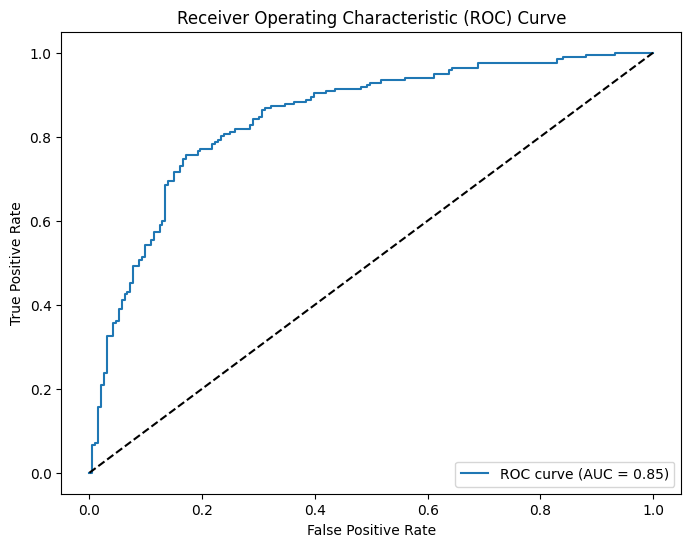

In [155]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

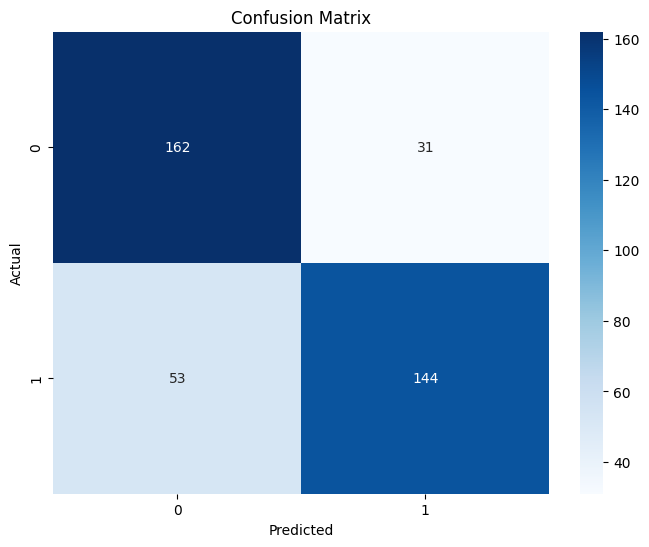

In [156]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [189]:
# Bayesian Optimization
param_space = {
    'C': (0.1, 100.0, 'log-uniform'),  # 0.1에서 100 사이의 로그 균등 분포
    'gamma': (0.001, 1.0, 'log-uniform'),  # 0.001에서 1 사이의 로그 균등 분포
    'kernel': ['linear', 'rbf', 'poly']  # 커널 함수의 후보
}

bayes_search = BayesSearchCV(SVC(), param_space, n_iter=32, cv=5, verbose=2, random_state=42)
bayes_search.fit(X_train, y_train)

print(bayes_search.best_params_)
grid_predictions = bayes_search.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; t

In [190]:
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.76      0.84      0.80       193
           1       0.82      0.74      0.78       197

    accuracy                           0.79       390
   macro avg       0.79      0.79      0.79       390
weighted avg       0.79      0.79      0.79       390



In [191]:
# F1 score - grid_predictions
accuracy = accuracy_score(y_test, grid_predictions)
precision = precision_score(y_test, grid_predictions)
recall = recall_score(y_test, grid_predictions)
f1 = f1_score(y_test, grid_predictions)
auc = roc_auc_score(y_test, y_prob)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

Accuracy: 0.79
Precision: 0.82
Recall: 0.74
F1 Score: 0.78
AUC: 0.85


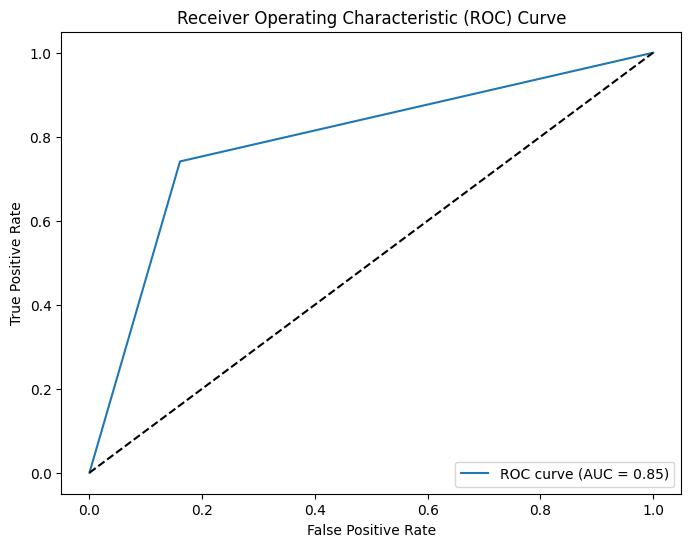

In [192]:
# ROC curve - grid_predictions
fpr, tpr, thresholds = roc_curve(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

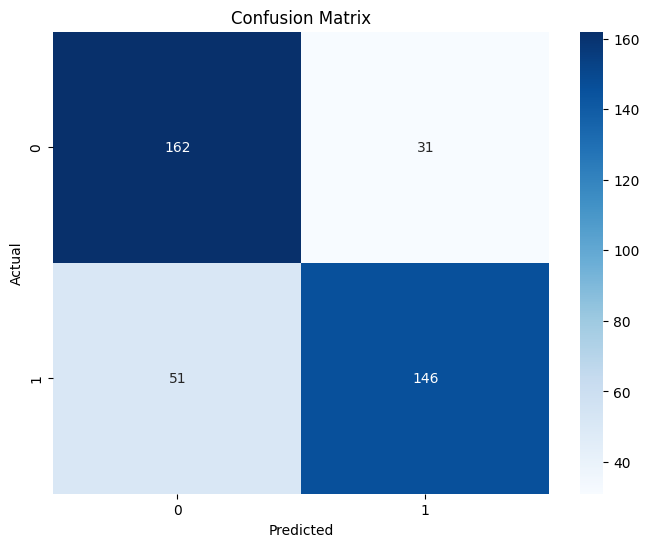

In [193]:
# 혼동 행렬 - grid_predictions
cm = confusion_matrix(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### SVM - demo X + followup GAD + current ANX

In [132]:
# demo 변수 불포함 + follow up GAD 분류

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO', 'GAD_base']]
y = df_scaled['Anx_group_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [133]:
# SVM 모델 학습
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [134]:
# 예측 및 평가
y_pred = svm_model.predict(X_test)

# 평가 결과 출력
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.75      0.84      0.80       193
           1       0.83      0.73      0.78       197

    accuracy                           0.79       390
   macro avg       0.79      0.79      0.79       390
weighted avg       0.79      0.79      0.79       390



In [135]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

TypeError: unsupported format string passed to function.__format__

<Figure size 800x600 with 0 Axes>

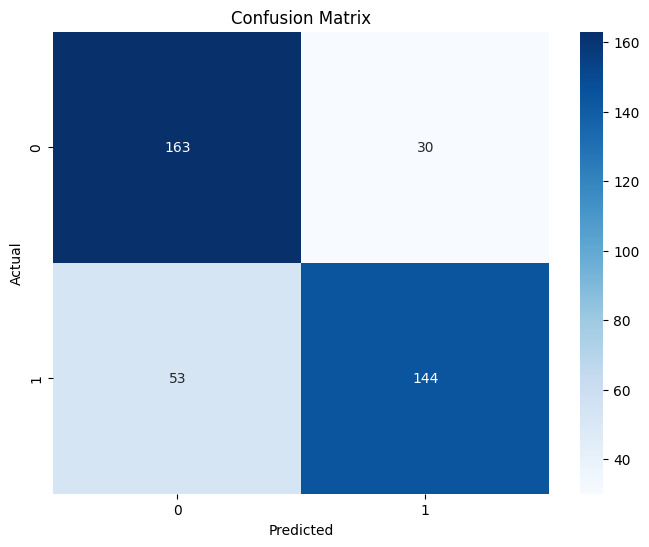

In [137]:
# 혼동 행렬
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [138]:
# Bayesian Optimization
param_space = {
    'C': (0.1, 100.0, 'log-uniform'),  # 0.1에서 100 사이의 로그 균등 분포
    'gamma': (0.001, 1.0, 'log-uniform'),  # 0.001에서 1 사이의 로그 균등 분포
    'kernel': ['linear', 'rbf', 'poly']  # 커널 함수의 후보
}

bayes_search = BayesSearchCV(SVC(), param_space, n_iter=32, cv=5, verbose=2, random_state=42)
bayes_search.fit(X_train, y_train)

print(bayes_search.best_params_)
grid_predictions = bayes_search.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
[CV] END C=1.6994636371262763, gamma=0.15246748254295628, kernel=poly; total time=   0.0s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; total time=   0.1s
[CV] END C=32.52108800594495, gamma=0.4466278825224283, kernel=linear; t

In [139]:
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.76      0.87      0.81       193
           1       0.85      0.74      0.79       197

    accuracy                           0.80       390
   macro avg       0.81      0.80      0.80       390
weighted avg       0.81      0.80      0.80       390



Feature ranking:
1. feature GAD_base (0.7007037064737627)
2. feature PHQ9 (0.36693139927753216)
3. feature DO (0.23347015649504982)
4. feature DERS (0.22479150592344088)
5. feature IUS (0.15916147628269786)
6. feature CFI (-0.06733563920332508)


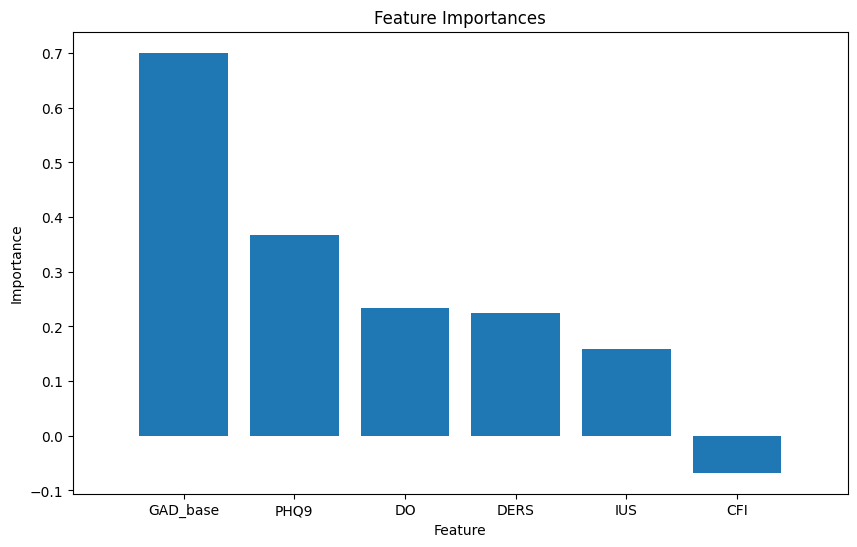

In [145]:
# feature importance & plot

# 특성 중요도 계산 및 시각화
importances = bayes_search.best_estimator_.coef_[0]
indices = np.argsort(importances)[::-1]
feature_names = X_train.columns

# 특성 중요도 출력
print("Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {feature_names[indices[f]]} ({importances[indices[f]]})")

# 특성 중요도 시각화
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), feature_names[indices])
plt.xlim([-1, X_train.shape[1]])
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()


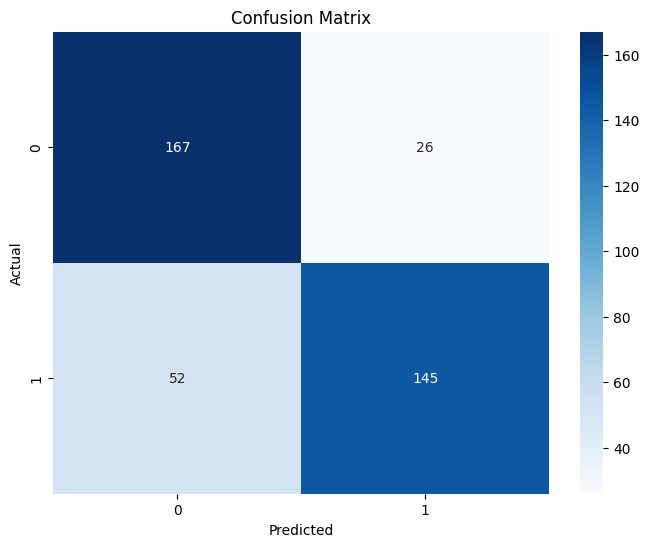

In [146]:
# 혼동 행렬 - grid_predictions
cm = confusion_matrix(y_test, grid_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### PCA

In [29]:
from sklearn.decomposition import PCA

In [202]:
# 공분산 행렬 계산

onlypsycho = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]

cov_matrix = np.cov(onlypsycho, rowvar=False)
print("Covariance Matrix:")
display(cov_matrix)

Covariance Matrix:


array([[ 1.00051335,  0.41124957, -0.38151328,  0.61955726,  0.51178744],
       [ 0.41124957,  1.00051335, -0.28426487,  0.53550514,  0.54304843],
       [-0.38151328, -0.28426487,  1.00051335, -0.57538338, -0.25682396],
       [ 0.61955726,  0.53550514, -0.57538338,  1.00051335,  0.57985675],
       [ 0.51178744,  0.54304843, -0.25682396,  0.57985675,  1.00051335]])

In [225]:
pca = PCA(n_components=5)
principal_components = pca.fit_transform(onlypsycho)

In [226]:
principal_components.shape
print(principal_components[0, :])

[ 2.57881231 -0.6690304  -0.61810656 -0.29385779  0.69397495]


In [227]:
# 카테고리 정보

pca_y = np.c_[principal_components, y]
pca_df = pd.DataFrame(data=pca_y, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'Anx_group_base'])
print("PCA Transformed Data:")
print(pca_df)

PCA Transformed Data:
           PC1       PC2       PC3       PC4       PC5  Anx_group_base
0     2.578812 -0.669030 -0.618107 -0.293858  0.693975             1.0
1    -1.087318 -0.353198 -0.279558  0.651840  0.320734             0.0
2     4.103010  0.035343  0.976799 -0.016000 -0.819521             1.0
3     0.715261  0.320008  0.571927  1.123427 -0.226661             1.0
4     4.513689  0.408342 -0.573582  0.527377  0.377717             1.0
...        ...       ...       ...       ...       ...             ...
1944 -2.117047  0.028878  0.235321  0.523645 -0.439081             0.0
1945 -1.564691  1.063777 -0.025294  0.099212 -0.044132             0.0
1946  1.621780  0.132710 -0.709782  0.683101  0.383718             0.0
1947 -1.506902  0.631130  0.146388  0.469780 -0.690839             0.0
1948 -0.910877 -0.230678 -0.527532  0.055832 -0.118528             0.0

[1949 rows x 6 columns]


<Axes: xlabel='PC1', ylabel='PC2'>

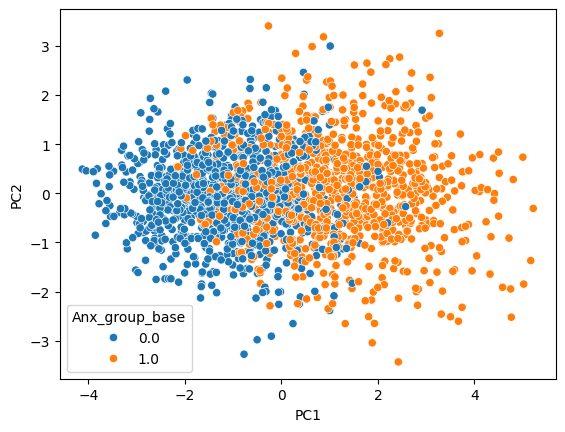

In [228]:
# plotting
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Anx_group_base')

In [229]:
# 주성분 설명 

explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio:")
print(explained_variance)

Explained Variance Ratio:
[0.58125965 0.16580485 0.11324246 0.08338793 0.05630511]


<Axes: xlabel='PC', ylabel='var'>

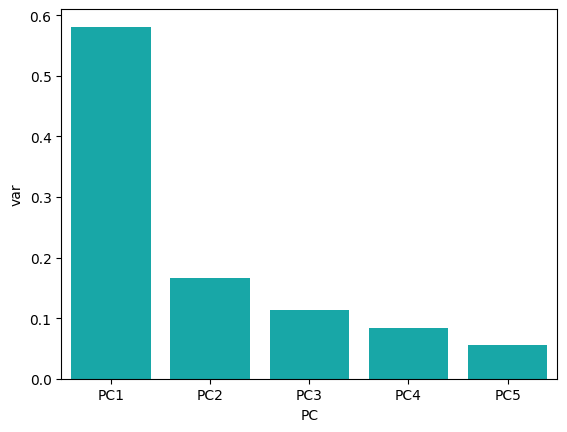

In [231]:
# 주성분의 분산 정보

pca_df_var = pd.DataFrame({'var': pca.explained_variance_ratio_,
                           'PC': ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']})

sns.barplot(x='PC', y='var', data=pca_df_var, color='c')

[0.42552308 0.54369119 0.64016267 0.71909082 0.79186308 0.85137169
 0.8956834  0.93525684 0.96204492 0.98466557 0.99436946 1.        ]


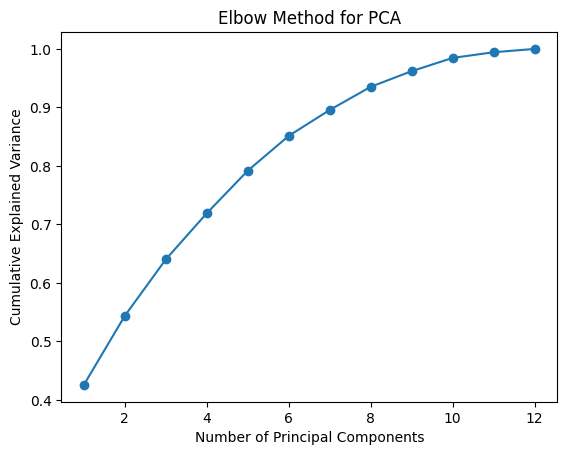

In [232]:
# PCA 수행

pca = PCA(n_components=None)
pca.fit(df_scaled)

# 누적 설명 분산 비율 확인

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
print(cumulative_explained_variance)

# 엘보 포인트 찾기

plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Elbow Method for PCA')
plt.show()

In [237]:
# 주성분 로딩 행렬 계산
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# 로딩 행렬을 데이터프레임으로 변환
loading_matrix = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], index=onlypsycho.columns)

# 로딩 행렬 출력
import ace_tools as tools; tools.display_dataframe_to_user(name="PCA Loading Matrix", dataframe=loading_matrix)

# 로딩 행렬 시각화
plt.figure(figsize=(12, 6))
sns.heatmap(loading_matrix, annot=True, cmap='viridis')
plt.title('PCA Loading Matrix')
plt.xlabel('Principal Components')
plt.ylabel('Original Features')
plt.show()

ValueError: Shape of passed values is (12, 12), indices imply (12, 5)

### Regressor - demo O + baseline GAD

In [5]:
!pip uninstall xgboost lightgbm --y

Found existing installation: xgboost 2.1.1
Uninstalling xgboost-2.1.1:
  Successfully uninstalled xgboost-2.1.1
Found existing installation: lightgbm 4.5.0
Uninstalling lightgbm-4.5.0:
  Successfully uninstalled lightgbm-4.5.0


In [6]:
!pip install xgboost lightgbm

  Using cached xgboost-2.1.1-py3-none-macosx_10_15_x86_64.macosx_11_0_x86_64.macosx_12_0_x86_64.whl.metadata (2.1 kB)
  Using cached lightgbm-4.5.0-py3-none-macosx_10_15_x86_64.whl.metadata (17 kB)
Using cached xgboost-2.1.1-py3-none-macosx_10_15_x86_64.macosx_11_0_x86_64.macosx_12_0_x86_64.whl (2.1 MB)
Using cached lightgbm-4.5.0-py3-none-macosx_10_15_x86_64.whl (1.9 MB)


In [30]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, r2_score

In [72]:
# demo 변수 포함 + baseline GAD 예측

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['GAD_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
# random forest regression modeling
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
rf_reg_model.fit(X, y)

RandomForestRegressor(n_estimators=1000, random_state=0)

In [33]:
# calculate MSE, RMSE score
neg_mse_scores = cross_val_score(rf_reg_model, X, y, 
                                 scoring='neg_mean_squared_error', cv=5)
rmse_scores = np.sqrt(-1 * neg_mse_scores)
avg_rmse = np.mean(rmse_scores)

In [35]:
# result of cross validation
print('5-fold / particular Negative MSE scores: ', np.round(neg_mse_scores, 2))
print('5-fold / particular RMSE scores: ', np.round(rmse_scores, 2))
print('5-fold / average RMSE: {0: .3f} '.format(avg_rmse))

5-fold / particular Negative MSE scores:  [-0.43 -0.34 -0.33 -0.34 -0.33]
5-fold / particular RMSE scores:  [0.66 0.59 0.58 0.58 0.58]
5-fold / average RMSE:  0.596 


In [73]:
# decision tree, GBM, XGBoost, LightGBM regressor modeling
dt_reg_model = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg_model = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg_model = XGBRegressor(n_estimators=1000)
lgb_reg_model = LGBMRegressor(n_estimators=1000)

In [74]:
# fitting each regressors
display(dt_reg_model.fit(X, y))
display(rf_reg_model.fit(X, y))
display(gb_reg_model.fit(X, y))
display(xgb_reg_model.fit(X, y))
display(lgb_reg_model.fit(X, y))

DecisionTreeRegressor(max_depth=4, random_state=0)

RandomForestRegressor(n_estimators=1000, random_state=0)

GradientBoostingRegressor(n_estimators=1000, random_state=0)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 337
[LightGBM] [Info] Number of data points in the train set: 1949, number of used features: 8
[LightGBM] [Info] Start training from score -0.000000


LGBMRegressor(n_estimators=1000)

In [75]:
# define fx - results of decision tree, GBM, XGBoost, LightGBM regressor
def regressor_cv(model, X, y):
    # 5-fold cross-validation에서 MSE, MAE, R^2 계산
    neg_mse_scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=5)
    neg_mae_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=5)
    r2_scores = cross_val_score(model, X, y, scoring='r2', cv=5)
    
    # RMSE 계산
    rmse_scores = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    
    # MAE 계산
    mae_scores = -1 * neg_mae_scores  
    # neg_mean_absolute_error는 음수로 제공되므로 부호 변경
    avg_mae = np.mean(mae_scores)
    
    # R^2 평균 계산
    avg_r2 = np.mean(r2_scores)
    
    # Adjusted R^2 계산
    n = X.shape[0]  # 샘플 수
    p = X.shape[1]  # 특성 수
    adjusted_r2_scores = 1 - (1 - r2_scores) * (n - 1) / (n - p - 1)
    avg_adjusted_r2 = np.mean(adjusted_r2_scores)
    
    # 결과 출력
    print('** ', model.__class__.__name__, ' **')
    print('5-fold / average RMSE: {0:.3f}'.format(avg_rmse))
    print('5-fold / average MAE: {0:.3f}'.format(avg_mae))
    print('5-fold / average R^2: {0:.3f}'.format(avg_r2))
    print('5-fold / average Adjusted R^2: {0:.3f}'.format(avg_adjusted_r2))
    print('-' * 40)

In [76]:
# show results
models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]

for model in models:
    regressor_cv(model, X, y)

**  DecisionTreeRegressor  **
5-fold / average RMSE: 0.647
5-fold / average MAE: 0.473
5-fold / average R^2: 0.574
5-fold / average Adjusted R^2: 0.572
----------------------------------------
**  RandomForestRegressor  **
5-fold / average RMSE: 0.596
5-fold / average MAE: 0.437
5-fold / average R^2: 0.639
5-fold / average Adjusted R^2: 0.637
----------------------------------------
**  GradientBoostingRegressor  **
5-fold / average RMSE: 0.659
5-fold / average MAE: 0.485
5-fold / average R^2: 0.559
5-fold / average Adjusted R^2: 0.558
----------------------------------------
**  XGBRegressor  **
5-fold / average RMSE: 0.665
5-fold / average MAE: 0.492
5-fold / average R^2: 0.552
5-fold / average Adjusted R^2: 0.550
----------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 332
[LightGBM] [Info] Number of data point

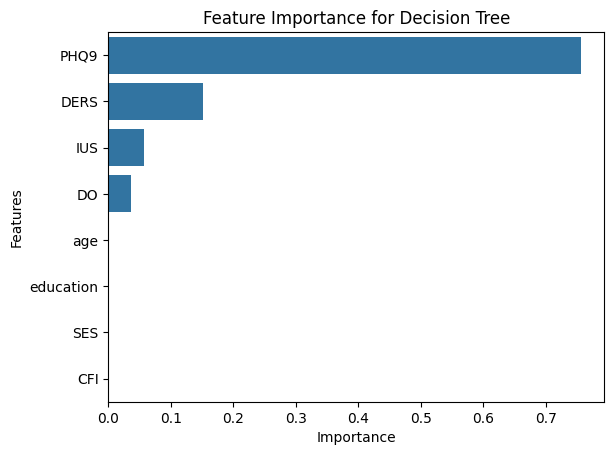

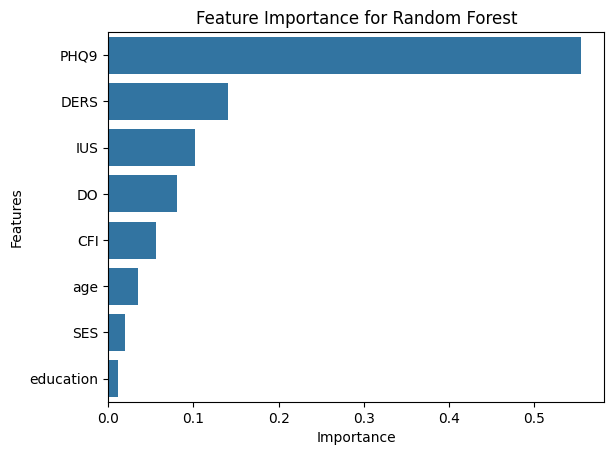

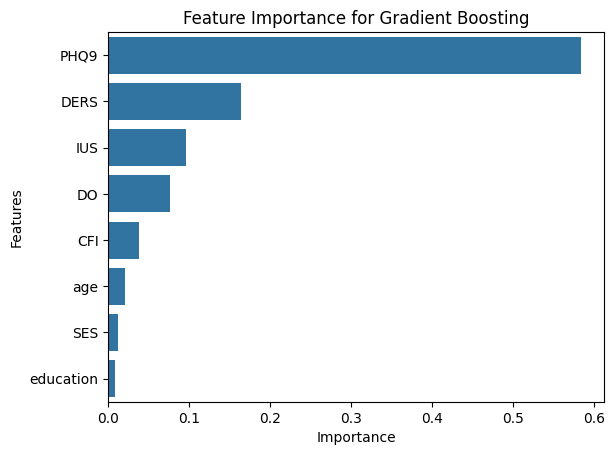

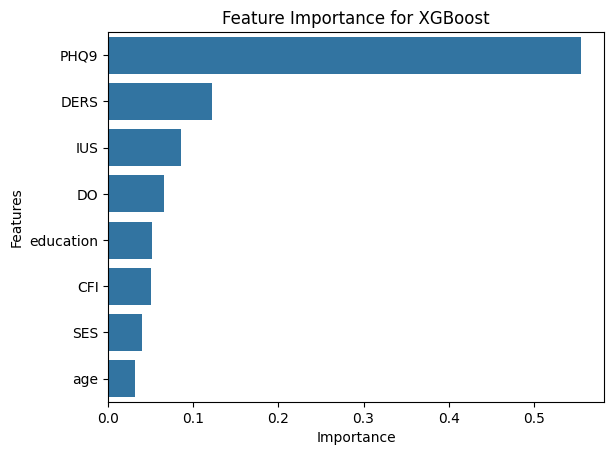

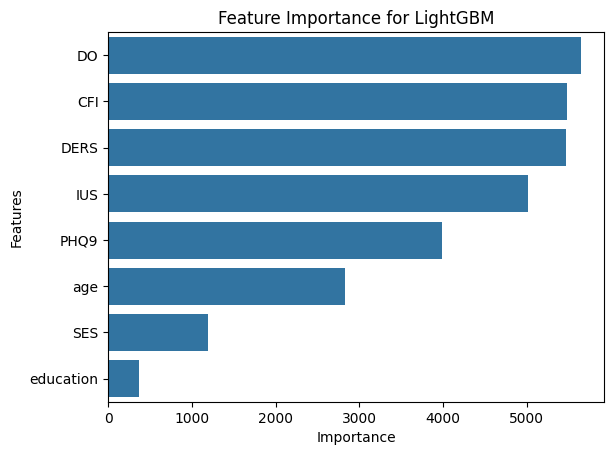

In [77]:
# feature importance plots

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

for i, model in enumerate(models):
    feature_series = pd.Series(data=model.feature_importances_, index=X.columns)
    feature_series = feature_series.sort_values(ascending=False)

    sns.barplot(x=feature_series, y=feature_series.index)
    plt.title(f'Feature Importance for {model_names[i]}')
    plt.xlabel('Importance')
    plt.ylabel('Features')
    
    plt.show()

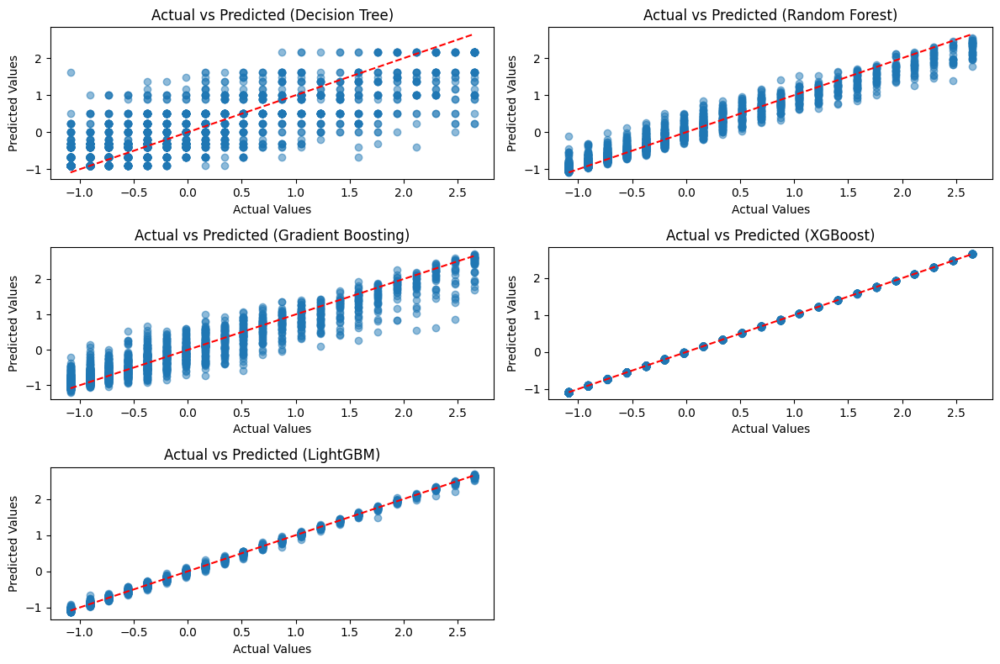

In [78]:
# compare actual and predicted values

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

plt.figure(figsize=(12, 8))

for i, model in enumerate(models):
    y_pred = model.predict(X) # 예측값 생성

    plt.subplot(3, 2, i + 1)
    
    # 실제값과 예측값 비교
    plt.scatter(y, y_pred, alpha=0.5)
    plt.plot([min(y), max(y)], [min(y), max(y)], color='red', linestyle='--')  # 완벽한 예측을 나타내는 선
    plt.title(f'Actual vs Predicted ({model_names[i]})')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()

In [79]:
# 회귀모델 -> 분류 성능 확인 함수
## GAD_base = 5 -> scaled = -0.196862
## GAD_fu = 5 -> scaled = -0.155137

def evaluate_classification_accuracy(models, model_names, X, y, threshold):
    for i, model in enumerate(models):
        y_pred = model.predict(X)

        # 이진 분류 (threshold 이상이면 1, 미만이면 0)
        y_pred_class = (y_pred >= threshold).astype(int)
        y_actual_class = (y >= threshold).astype(int)

        # 성능 지표 계산
        accuracy = accuracy_score(y_actual_class, y_pred_class)
        precision = precision_score(y_actual_class, y_pred_class)
        recall = recall_score(y_actual_class, y_pred_class)
        f1 = f1_score(y_actual_class, y_pred_class)

        # 결과 출력
        print(f'Model: {model_names[i]}')
        print(f'Accuracy: {accuracy:.3f}')
        print(f'Precision: {precision:.3f}')
        print(f'Recall: {recall:.3f}')
        print(f'F1 Score: {f1:.3f}')
        print('-' * 40)
        
    """
    주어진 회귀 모델 리스트에 대해 이진 분류 후 정확도를 계산하는 함수.

    Parameters:
    - models: 회귀 모델들의 리스트 (예: [dt_reg_model, rf_reg_model, ...])
    - model_names: 모델의 이름 리스트 (예: ['Decision Tree', 'Random Forest', ...])
    - X: 입력 데이터 (피처)
    - y: 실제값 (종속 변수, 레이블)
    - threshold: 이진 분류를 위한 기준값 (default: -)

    Returns:
    - 각 모델에 대한 정확도 출력
    """

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

evaluate_classification_accuracy(models, model_names, X, y, threshold=-0.196862)

Model: Decision Tree
Accuracy: 0.809
Precision: 0.845
Recall: 0.756
F1 Score: 0.798
----------------------------------------
Model: Random Forest
Accuracy: 0.933
Precision: 0.950
Recall: 0.914
F1 Score: 0.932
----------------------------------------
Model: Gradient Boosting
Accuracy: 0.888
Precision: 0.914
Recall: 0.856
F1 Score: 0.884
----------------------------------------
Model: XGBoost
Accuracy: 0.965
Precision: 1.000
Recall: 0.930
F1 Score: 0.964
----------------------------------------
Model: LightGBM
Accuracy: 0.959
Precision: 1.000
Recall: 0.918
F1 Score: 0.957
----------------------------------------


In [ ]:
# 각 회귀 모델에 대한 이진 분류 혼동 행렬

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for idx, (model, name) in enumerate(zip(models, model_names)):
    if idx < 5:  # 5개 모델에 대해서만 수행
        y_pred = model.predict(X)
        y_pred_class = (y_pred >= -0.196862).astype(int)
        y_actual_class = (y >= -0.196862).astype(int)
        
        cm = confusion_matrix(y_actual_class, y_pred_class)
        
        sns.heatmap(cm, annot=True, fmt='d', ax=axes[idx])
        axes[idx].set_title(f'{name}의 혼동 행렬')
        axes[idx].set_xlabel('예측값')
        axes[idx].set_ylabel('실제값')

plt.tight_layout()
plt.show()


### Regressor - demo O + follow up GAD

In [80]:
# demo 변수 포함 + followup GAD 예측

X = df_scaled[['age', 'education', 'SES', 'PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['GAD_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [106]:
# random forest regression modeling
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
rf_reg_model.fit(X, y)

RandomForestRegressor(n_estimators=1000, random_state=0)

In [107]:
# calculate MSE, RMSE score
neg_mse_scores = cross_val_score(rf_reg_model, X, y, 
                                 scoring='neg_mean_squared_error', cv=5)
rmse_scores = np.sqrt(-1 * neg_mse_scores)
avg_rmse = np.mean(rmse_scores)

In [108]:
# result of cross validation
print('5-fold / particular Negative MSE scores: ', np.round(neg_mse_scores, 2))
print('5-fold / particular RMSE scores: ', np.round(rmse_scores, 2))
print('5-fold / average RMSE: {0: .3f} '.format(avg_rmse))

5-fold / particular Negative MSE scores:  [-0.73 -0.63 -0.55 -0.48 -0.48]
5-fold / particular RMSE scores:  [0.86 0.79 0.74 0.7  0.69]
5-fold / average RMSE:  0.755 


In [81]:
# decision tree, GBM, XGBoost, LightGBM regressor modeling
dt_reg_model = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg_model = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg_model = XGBRegressor(n_estimators=1000)
lgb_reg_model = LGBMRegressor(n_estimators=1000)

In [82]:
# fitting each regressors
display(dt_reg_model.fit(X, y))
display(rf_reg_model.fit(X, y))
display(gb_reg_model.fit(X, y))
display(xgb_reg_model.fit(X, y))
display(lgb_reg_model.fit(X, y))

DecisionTreeRegressor(max_depth=4, random_state=0)

RandomForestRegressor(n_estimators=1000, random_state=0)

GradientBoostingRegressor(n_estimators=1000, random_state=0)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 337
[LightGBM] [Info] Number of data points in the train set: 1949, number of used features: 8
[LightGBM] [Info] Start training from score 0.000000


LGBMRegressor(n_estimators=1000)

In [83]:
# define fx - results of decision tree, GBM, XGBoost, LightGBM regressor
def regressor_cv(model, X, y):
    # 5-fold cross-validation에서 MSE, MAE, R^2 계산
    neg_mse_scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=5)
    neg_mae_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=5)
    r2_scores = cross_val_score(model, X, y, scoring='r2', cv=5)
    
    # RMSE 계산
    rmse_scores = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    
    # MAE 계산
    mae_scores = -1 * neg_mae_scores  
    # neg_mean_absolute_error는 음수로 제공되므로 부호 변경
    avg_mae = np.mean(mae_scores)
    
    # R^2 평균 계산
    avg_r2 = np.mean(r2_scores)
    
    # Adjusted R^2 계산
    n = X.shape[0]  # 샘플 수
    p = X.shape[1]  # 특성 수
    adjusted_r2_scores = 1 - (1 - r2_scores) * (n - 1) / (n - p - 1)
    avg_adjusted_r2 = np.mean(adjusted_r2_scores)
    
    # 결과 출력
    print('** ', model.__class__.__name__, ' **')
    print('5-fold / average RMSE: {0:.3f}'.format(avg_rmse))
    print('5-fold / average MAE: {0:.3f}'.format(avg_mae))
    print('5-fold / average R^2: {0:.3f}'.format(avg_r2))
    print('5-fold / average Adjusted R^2: {0:.3f}'.format(avg_adjusted_r2))
    print('-' * 40)

In [84]:
# show results
models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]

for model in models:
    regressor_cv(model, X, y)

**  DecisionTreeRegressor  **
5-fold / average RMSE: 0.767
5-fold / average MAE: 0.578
5-fold / average R^2: 0.399
5-fold / average Adjusted R^2: 0.396
----------------------------------------
**  RandomForestRegressor  **
5-fold / average RMSE: 0.755
5-fold / average MAE: 0.573
5-fold / average R^2: 0.416
5-fold / average Adjusted R^2: 0.413
----------------------------------------
**  GradientBoostingRegressor  **
5-fold / average RMSE: 0.836
5-fold / average MAE: 0.620
5-fold / average R^2: 0.286
5-fold / average Adjusted R^2: 0.283
----------------------------------------
**  XGBRegressor  **
5-fold / average RMSE: 0.827
5-fold / average MAE: 0.626
5-fold / average R^2: 0.297
5-fold / average Adjusted R^2: 0.294
----------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 332
[LightGBM] [Info] Number of data point

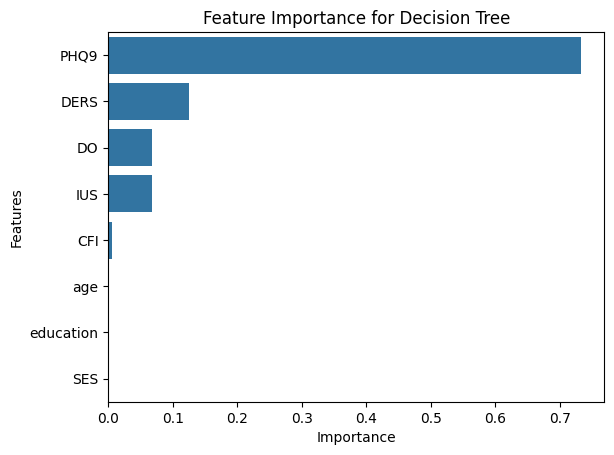

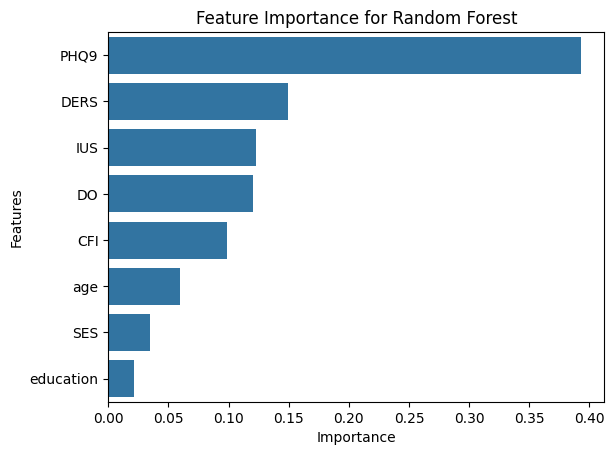

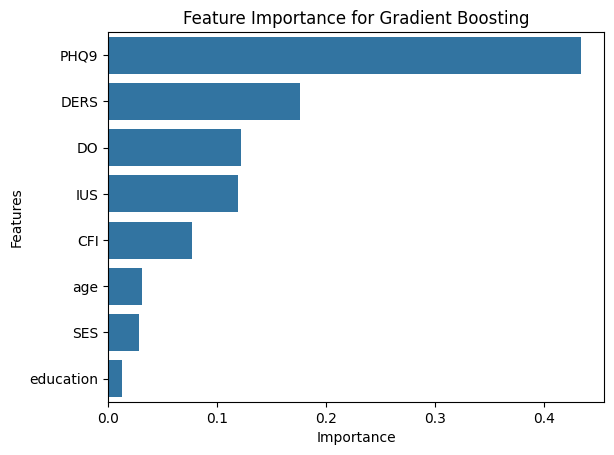

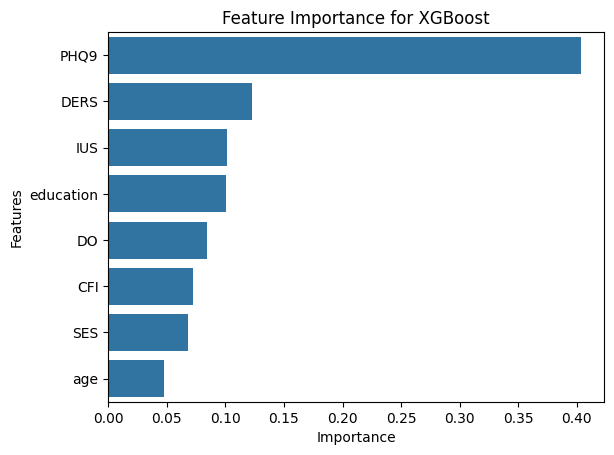

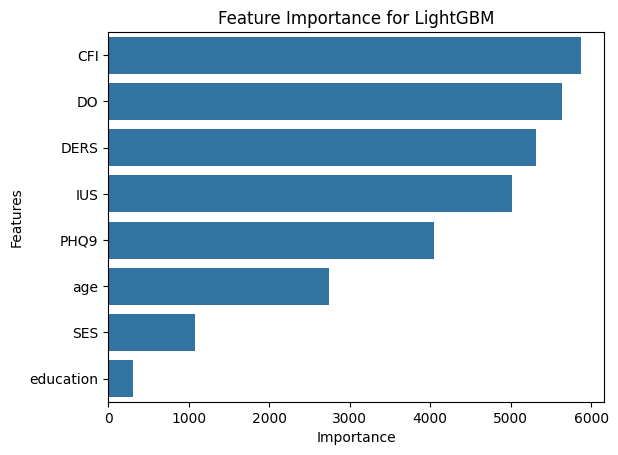

In [85]:
# feature importance plots

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

for i, model in enumerate(models):
    feature_series = pd.Series(data=model.feature_importances_, index=X.columns)
    feature_series = feature_series.sort_values(ascending=False)

    sns.barplot(x=feature_series, y=feature_series.index)
    plt.title(f'Feature Importance for {model_names[i]}')
    plt.xlabel('Importance')
    plt.ylabel('Features')
    
    plt.show()

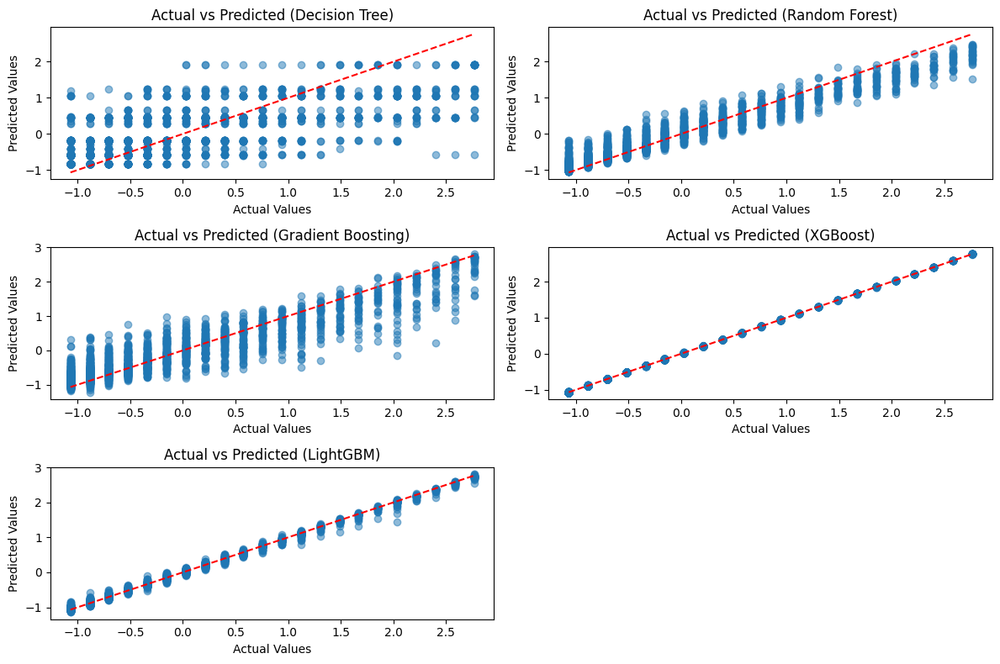

In [86]:
# compare actual and predicted values

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

plt.figure(figsize=(12, 8))

for i, model in enumerate(models):
    y_pred = model.predict(X) # 예측값 생성

    plt.subplot(3, 2, i + 1)
    
    # 실제값과 예측값 비교
    plt.scatter(y, y_pred, alpha=0.5)
    plt.plot([min(y), max(y)], [min(y), max(y)], color='red', linestyle='--')  # 완벽한 예측을 나타내는 선
    plt.title(f'Actual vs Predicted ({model_names[i]})')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()

In [87]:
# 회귀모델 -> 분류 성능 확인 함수
## GAD_base = 5 -> scaled = -0.196862
## GAD_fu = 5 -> scaled = -0.155137

def evaluate_classification_accuracy(models, model_names, X, y, threshold):
    for i, model in enumerate(models):
        y_pred = model.predict(X)

        # 이진 분류 (threshold 이상이면 1, 미만이면 0)
        y_pred_class = (y_pred >= threshold).astype(int)
        y_actual_class = (y >= threshold).astype(int)

        # 성능 지표 계산
        accuracy = accuracy_score(y_actual_class, y_pred_class)
        precision = precision_score(y_actual_class, y_pred_class)
        recall = recall_score(y_actual_class, y_pred_class)
        f1 = f1_score(y_actual_class, y_pred_class)

        # 결과 출력
        print(f'Model: {model_names[i]}')
        print(f'Accuracy: {accuracy:.3f}')
        print(f'Precision: {precision:.3f}')
        print(f'Recall: {recall:.3f}')
        print(f'F1 Score: {f1:.3f}')
        print('-' * 40)
        
    """
    주어진 회귀 모델 리스트에 대해 이진 분류 후 정확도를 계산하는 함수.

    Parameters:
    - models: 회귀 모델들의 리스트 (예: [dt_reg_model, rf_reg_model, ...])
    - model_names: 모델의 이름 리스트 (예: ['Decision Tree', 'Random Forest', ...])
    - X: 입력 데이터 (피처)
    - y: 실제값 (종속 변수, 레이블)
    - threshold: 이진 분류를 위한 기준값 (default: -)

    Returns:
    - 각 모델에 대한 정확도 출력
    """

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

evaluate_classification_accuracy(models, model_names, X, y, threshold=-0.155137)


Model: Decision Tree
Accuracy: 0.773
Precision: 0.811
Recall: 0.686
F1 Score: 0.743
----------------------------------------
Model: Random Forest
Accuracy: 0.936
Precision: 0.935
Recall: 0.930
F1 Score: 0.933
----------------------------------------
Model: Gradient Boosting
Accuracy: 0.880
Precision: 0.881
Recall: 0.867
F1 Score: 0.874
----------------------------------------
Model: XGBoost
Accuracy: 0.967
Precision: 1.000
Recall: 0.930
F1 Score: 0.964
----------------------------------------
Model: LightGBM
Accuracy: 0.969
Precision: 0.999
Recall: 0.937
F1 Score: 0.967
----------------------------------------


### Regressor - demo X + baseline GAD

In [88]:
# demo 변수 불포함 + baseline GAD 예측

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['GAD_base']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [89]:
# decision tree, GBM, XGBoost, LightGBM regressor modeling
dt_reg_model = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg_model = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg_model = XGBRegressor(n_estimators=1000)
lgb_reg_model = LGBMRegressor(n_estimators=1000)

In [90]:
# fitting each regressors
display(dt_reg_model.fit(X, y))
display(rf_reg_model.fit(X, y))
display(gb_reg_model.fit(X, y))
display(xgb_reg_model.fit(X, y))
display(lgb_reg_model.fit(X, y))

DecisionTreeRegressor(max_depth=4, random_state=0)

RandomForestRegressor(n_estimators=1000, random_state=0)

GradientBoostingRegressor(n_estimators=1000, random_state=0)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 308
[LightGBM] [Info] Number of data points in the train set: 1949, number of used features: 5
[LightGBM] [Info] Start training from score -0.000000


LGBMRegressor(n_estimators=1000)

In [91]:
# define fx - results of decision tree, GBM, XGBoost, LightGBM regressor
def regressor_cv(model, X, y):
    # 5-fold cross-validation에서 MSE, MAE, R^2 계산
    neg_mse_scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=5)
    neg_mae_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=5)
    r2_scores = cross_val_score(model, X, y, scoring='r2', cv=5)
    
    # RMSE 계산
    rmse_scores = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    
    # MAE 계산
    mae_scores = -1 * neg_mae_scores  
    # neg_mean_absolute_error는 음수로 제공되므로 부호 변경
    avg_mae = np.mean(mae_scores)
    
    # R^2 평균 계산
    avg_r2 = np.mean(r2_scores)
    
    # Adjusted R^2 계산
    n = X.shape[0]  # 샘플 수
    p = X.shape[1]  # 특성 수
    adjusted_r2_scores = 1 - (1 - r2_scores) * (n - 1) / (n - p - 1)
    avg_adjusted_r2 = np.mean(adjusted_r2_scores)
    
    # 결과 출력
    print('** ', model.__class__.__name__, ' **')
    print('5-fold / average RMSE: {0:.3f}'.format(avg_rmse))
    print('5-fold / average MAE: {0:.3f}'.format(avg_mae))
    print('5-fold / average R^2: {0:.3f}'.format(avg_r2))
    print('5-fold / average Adjusted R^2: {0:.3f}'.format(avg_adjusted_r2))
    print('-' * 40)

In [92]:
# show results
models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
for model in models:
    regressor_cv(model, X, y)

**  DecisionTreeRegressor  **
5-fold / average RMSE: 0.647
5-fold / average MAE: 0.473
5-fold / average R^2: 0.574
5-fold / average Adjusted R^2: 0.573
----------------------------------------
**  RandomForestRegressor  **
5-fold / average RMSE: 0.597
5-fold / average MAE: 0.438
5-fold / average R^2: 0.637
5-fold / average Adjusted R^2: 0.636
----------------------------------------
**  GradientBoostingRegressor  **
5-fold / average RMSE: 0.662
5-fold / average MAE: 0.482
5-fold / average R^2: 0.555
5-fold / average Adjusted R^2: 0.554
----------------------------------------
**  XGBRegressor  **
5-fold / average RMSE: 0.673
5-fold / average MAE: 0.496
5-fold / average R^2: 0.539
5-fold / average Adjusted R^2: 0.538
----------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 304
[LightGBM] [Info] Number of data point

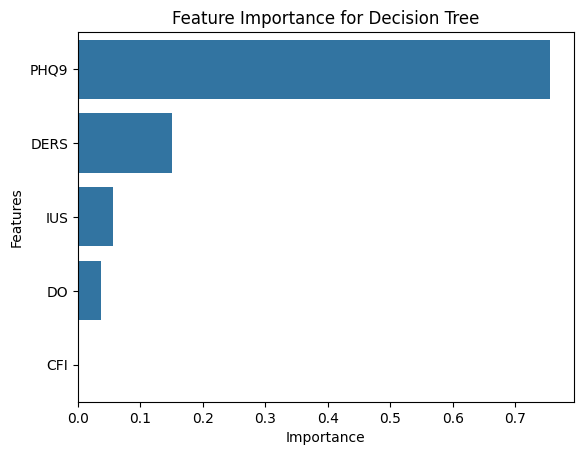

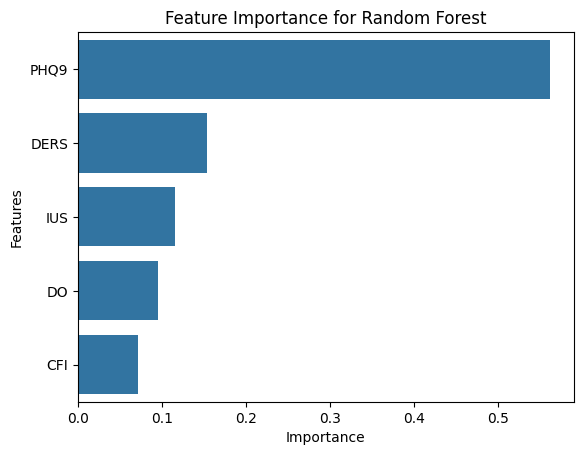

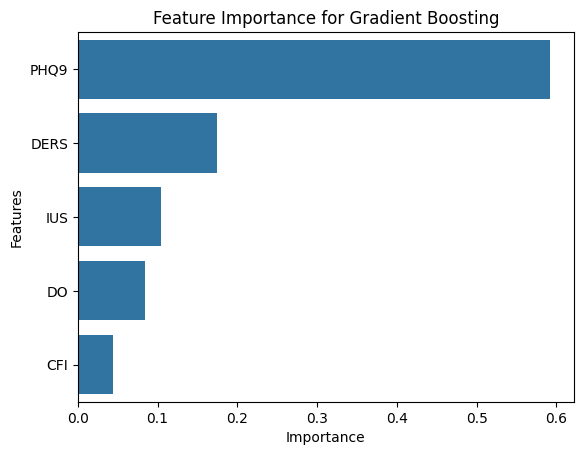

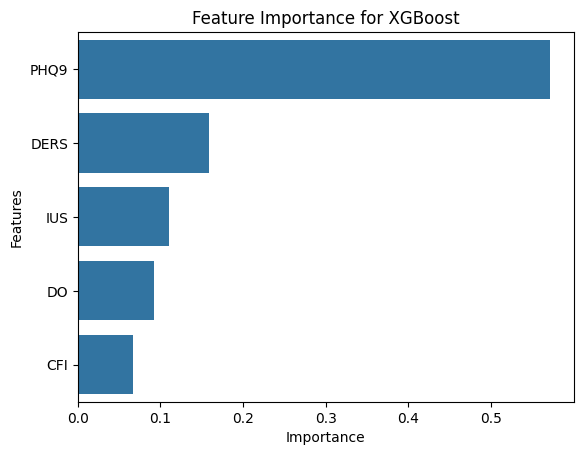

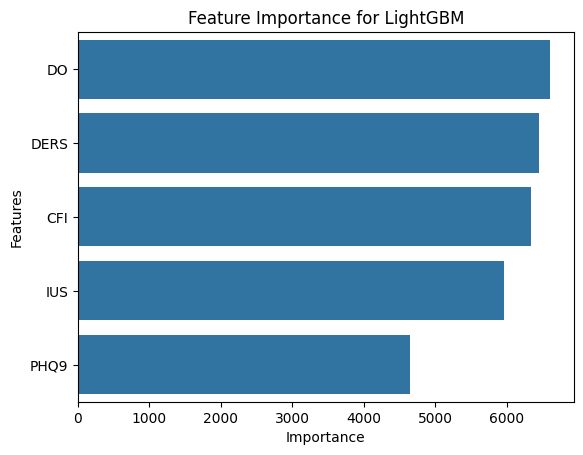

In [93]:
# feature importance plots

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

for i, model in enumerate(models):
    feature_series = pd.Series(data=model.feature_importances_, index=X.columns)
    feature_series = feature_series.sort_values(ascending=False)

    sns.barplot(x=feature_series, y=feature_series.index)
    plt.title(f'Feature Importance for {model_names[i]}')
    plt.xlabel('Importance')
    plt.ylabel('Features')
    
    plt.show()

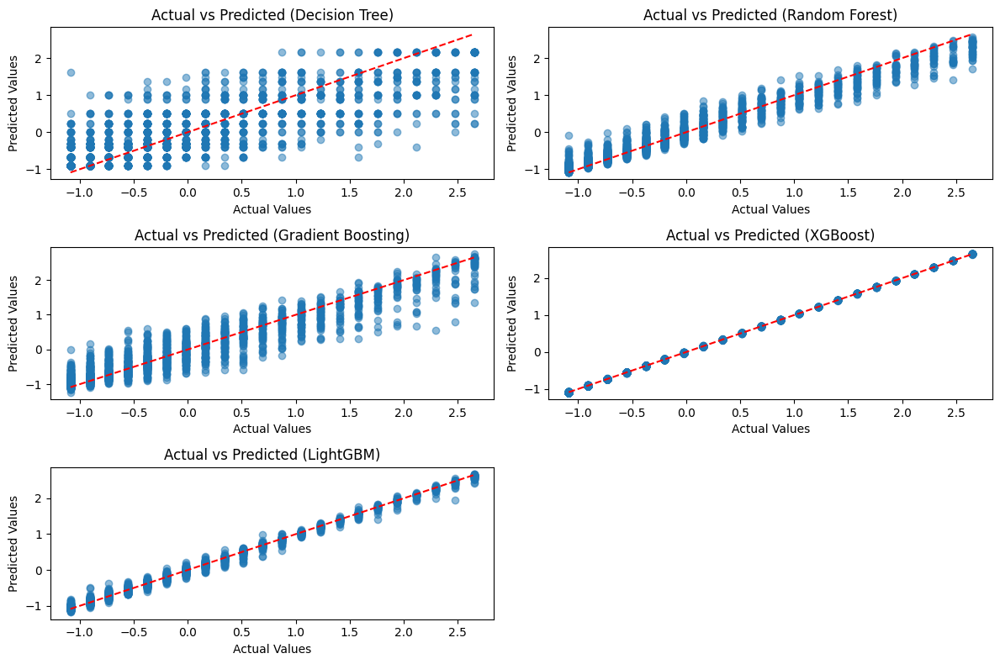

In [94]:
# compare actual and predicted values

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

plt.figure(figsize=(12, 8))

for i, model in enumerate(models):
    y_pred = model.predict(X) # 예측값 생성

    plt.subplot(3, 2, i + 1)
    
    # 실제값과 예측값 비교
    plt.scatter(y, y_pred, alpha=0.5)
    plt.plot([min(y), max(y)], [min(y), max(y)], color='red', linestyle='--')  # 완벽한 예측을 나타내는 선
    plt.title(f'Actual vs Predicted ({model_names[i]})')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()

In [95]:
# 회귀모델 -> 분류 성능 확인 함수
## GAD_base = 5 -> scaled = -0.196862
## GAD_fu = 5 -> scaled = -0.155137

def evaluate_classification_accuracy(models, model_names, X, y, threshold):
    for i, model in enumerate(models):
        y_pred = model.predict(X)

        # 이진 분류 (threshold 이상이면 1, 미만이면 0)
        y_pred_class = (y_pred >= threshold).astype(int)
        y_actual_class = (y >= threshold).astype(int)

        # 성능 지표 계산
        accuracy = accuracy_score(y_actual_class, y_pred_class)
        precision = precision_score(y_actual_class, y_pred_class)
        recall = recall_score(y_actual_class, y_pred_class)
        f1 = f1_score(y_actual_class, y_pred_class)

        # 결과 출력
        print(f'Model: {model_names[i]}')
        print(f'Accuracy: {accuracy:.3f}')
        print(f'Precision: {precision:.3f}')
        print(f'Recall: {recall:.3f}')
        print(f'F1 Score: {f1:.3f}')
        print('-' * 40)
        
    """
    주어진 회귀 모델 리스트에 대해 이진 분류 후 정확도를 계산하는 함수.

    Parameters:
    - models: 회귀 모델들의 리스트 (예: [dt_reg_model, rf_reg_model, ...])
    - model_names: 모델의 이름 리스트 (예: ['Decision Tree', 'Random Forest', ...])
    - X: 입력 데이터 (피처)
    - y: 실제값 (종속 변수, 레이블)
    - threshold: 이진 분류를 위한 기준값 (default: -)

    Returns:
    - 각 모델에 대한 정확도 출력
    """

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

evaluate_classification_accuracy(models, model_names, X, y, threshold=-0.196862)

Model: Decision Tree
Accuracy: 0.809
Precision: 0.845
Recall: 0.756
F1 Score: 0.798
----------------------------------------
Model: Random Forest
Accuracy: 0.933
Precision: 0.953
Recall: 0.912
F1 Score: 0.932
----------------------------------------
Model: Gradient Boosting
Accuracy: 0.879
Precision: 0.906
Recall: 0.846
F1 Score: 0.875
----------------------------------------
Model: XGBoost
Accuracy: 0.966
Precision: 1.000
Recall: 0.931
F1 Score: 0.964
----------------------------------------
Model: LightGBM
Accuracy: 0.964
Precision: 0.999
Recall: 0.928
F1 Score: 0.962
----------------------------------------


### Regressor - demo X + follow up GAD

In [96]:
# demo 변수 불포함 + follow up GAD 예측

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO']]
y = df_scaled['GAD_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [97]:
# decision tree, GBM, XGBoost, LightGBM regressor modeling
dt_reg_model = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg_model = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg_model = XGBRegressor(n_estimators=1000)
lgb_reg_model = LGBMRegressor(n_estimators=1000)

In [98]:
# fitting each regressors
display(dt_reg_model.fit(X, y))
display(rf_reg_model.fit(X, y))
display(gb_reg_model.fit(X, y))
display(xgb_reg_model.fit(X, y))
display(lgb_reg_model.fit(X, y))

DecisionTreeRegressor(max_depth=4, random_state=0)

RandomForestRegressor(n_estimators=1000, random_state=0)

GradientBoostingRegressor(n_estimators=1000, random_state=0)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 308
[LightGBM] [Info] Number of data points in the train set: 1949, number of used features: 5
[LightGBM] [Info] Start training from score 0.000000


LGBMRegressor(n_estimators=1000)

In [99]:
# define fx - results of decision tree, GBM, XGBoost, LightGBM regressor
def regressor_cv(model, X, y):
    # 5-fold cross-validation에서 MSE, MAE, R^2 계산
    neg_mse_scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=5)
    neg_mae_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=5)
    r2_scores = cross_val_score(model, X, y, scoring='r2', cv=5)
    
    # RMSE 계산
    rmse_scores = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    
    # MAE 계산
    mae_scores = -1 * neg_mae_scores  
    # neg_mean_absolute_error는 음수로 제공되므로 부호 변경
    avg_mae = np.mean(mae_scores)
    
    # R^2 평균 계산
    avg_r2 = np.mean(r2_scores)
    
    # Adjusted R^2 계산
    n = X.shape[0]  # 샘플 수
    p = X.shape[1]  # 특성 수
    adjusted_r2_scores = 1 - (1 - r2_scores) * (n - 1) / (n - p - 1)
    avg_adjusted_r2 = np.mean(adjusted_r2_scores)
    
    # 결과 출력
    print('** ', model.__class__.__name__, ' **')
    print('5-fold / average RMSE: {0:.3f}'.format(avg_rmse))
    print('5-fold / average MAE: {0:.3f}'.format(avg_mae))
    print('5-fold / average R^2: {0:.3f}'.format(avg_r2))
    print('5-fold / average Adjusted R^2: {0:.3f}'.format(avg_adjusted_r2))
    print('-' * 40)

In [100]:
# show results
models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
for model in models:
    regressor_cv(model, X, y)

**  DecisionTreeRegressor  **
5-fold / average RMSE: 0.766
5-fold / average MAE: 0.577
5-fold / average R^2: 0.399
5-fold / average Adjusted R^2: 0.398
----------------------------------------
**  RandomForestRegressor  **
5-fold / average RMSE: 0.764
5-fold / average MAE: 0.576
5-fold / average R^2: 0.402
5-fold / average Adjusted R^2: 0.400
----------------------------------------
**  GradientBoostingRegressor  **
5-fold / average RMSE: 0.822
5-fold / average MAE: 0.614
5-fold / average R^2: 0.309
5-fold / average Adjusted R^2: 0.307
----------------------------------------
**  XGBRegressor  **
5-fold / average RMSE: 0.839
5-fold / average MAE: 0.629
5-fold / average R^2: 0.279
5-fold / average Adjusted R^2: 0.277
----------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 304
[LightGBM] [Info] Number of data point

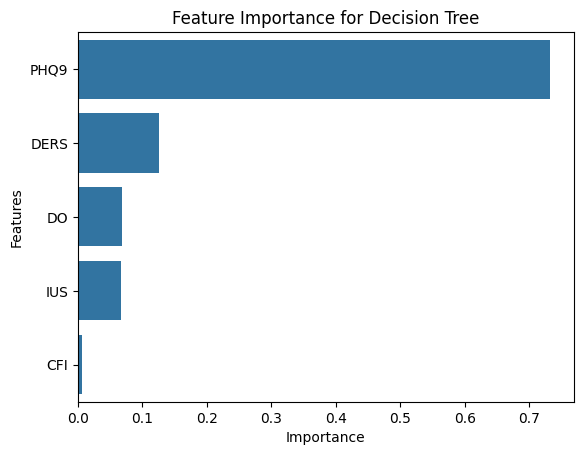

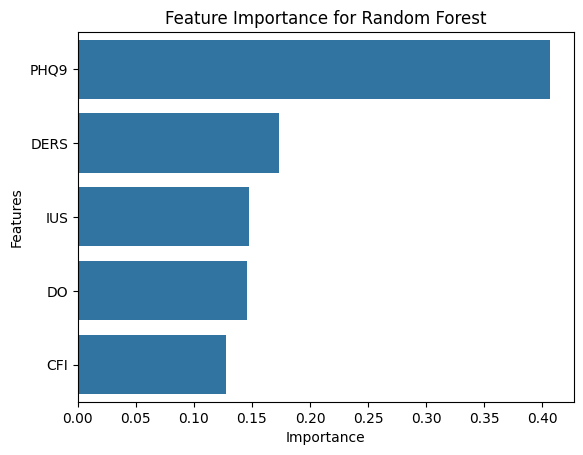

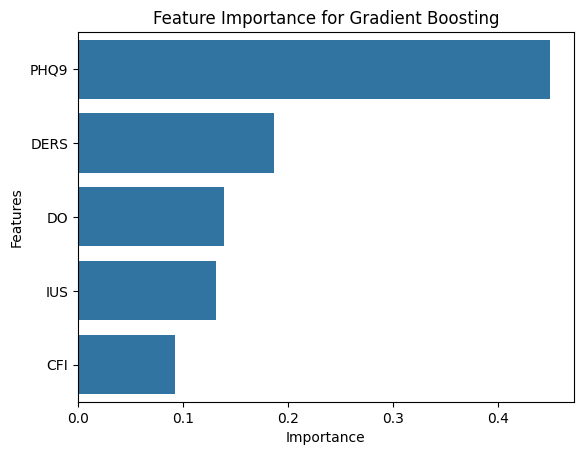

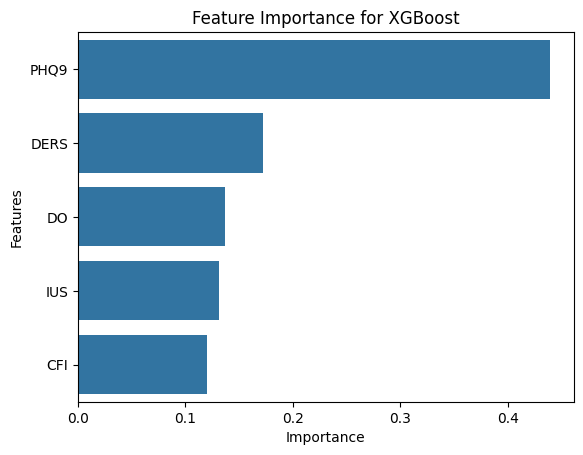

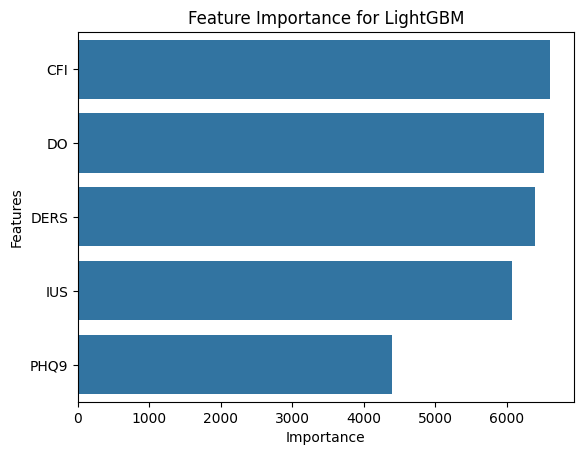

In [101]:
# feature importance plots

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

for i, model in enumerate(models):
    feature_series = pd.Series(data=model.feature_importances_, index=X.columns)
    feature_series = feature_series.sort_values(ascending=False)

    sns.barplot(x=feature_series, y=feature_series.index)
    plt.title(f'Feature Importance for {model_names[i]}')
    plt.xlabel('Importance')
    plt.ylabel('Features')
    
    plt.show()

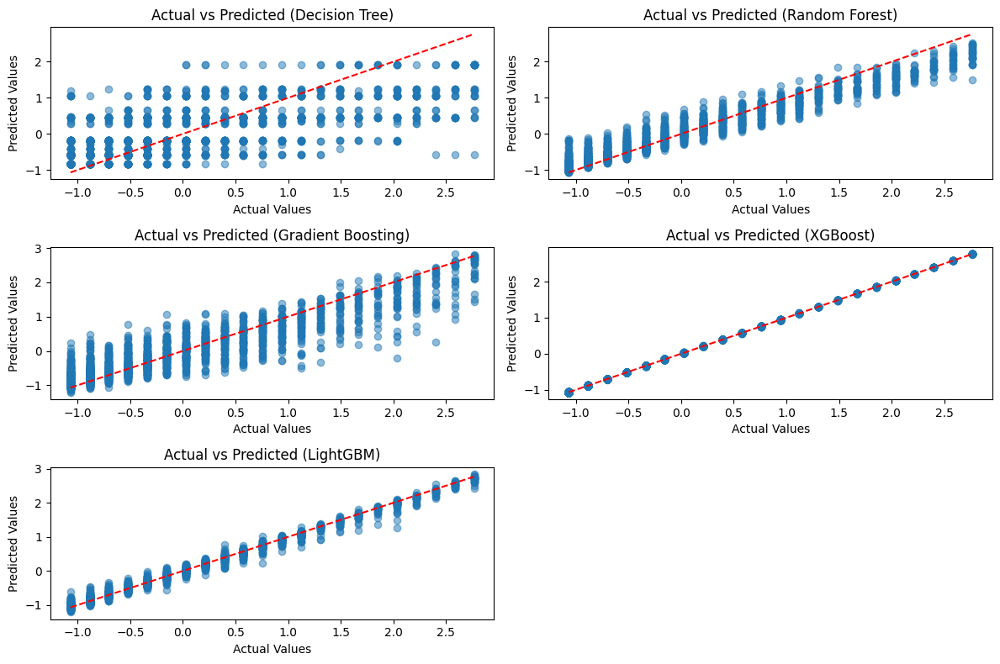

In [102]:
# compare actual and predicted values

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

plt.figure(figsize=(12, 8))

for i, model in enumerate(models):
    y_pred = model.predict(X) # 예측값 생성

    plt.subplot(3, 2, i + 1)
    
    # 실제값과 예측값 비교
    plt.scatter(y, y_pred, alpha=0.5)
    plt.plot([min(y), max(y)], [min(y), max(y)], color='red', linestyle='--')  # 완벽한 예측을 나타내는 선
    plt.title(f'Actual vs Predicted ({model_names[i]})')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()

In [103]:
# 회귀모델 -> 분류 성능 확인 함수
## GAD_base = 5 -> scaled = -0.196862
## GAD_fu = 5 -> scaled = -0.155137

def evaluate_classification_accuracy(models, model_names, X, y, threshold):
    for i, model in enumerate(models):
        y_pred = model.predict(X)

        # 이진 분류 (threshold 이상이면 1, 미만이면 0)
        y_pred_class = (y_pred >= threshold).astype(int)
        y_actual_class = (y >= threshold).astype(int)

        # 성능 지표 계산
        accuracy = accuracy_score(y_actual_class, y_pred_class)
        precision = precision_score(y_actual_class, y_pred_class)
        recall = recall_score(y_actual_class, y_pred_class)
        f1 = f1_score(y_actual_class, y_pred_class)

        # 결과 출력
        print(f'Model: {model_names[i]}')
        print(f'Accuracy: {accuracy:.3f}')
        print(f'Precision: {precision:.3f}')
        print(f'Recall: {recall:.3f}')
        print(f'F1 Score: {f1:.3f}')
        print('-' * 40)
        
    """
    주어진 회귀 모델 리스트에 대해 이진 분류 후 정확도를 계산하는 함수.

    Parameters:
    - models: 회귀 모델들의 리스트 (예: [dt_reg_model, rf_reg_model, ...])
    - model_names: 모델의 이름 리스트 (예: ['Decision Tree', 'Random Forest', ...])
    - X: 입력 데이터 (피처)
    - y: 실제값 (종속 변수, 레이블)
    - threshold: 이진 분류를 위한 기준값 (default: -)

    Returns:
    - 각 모델에 대한 정확도 출력
    """

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

evaluate_classification_accuracy(models, model_names, X, y, threshold=-0.155137)

Model: Decision Tree
Accuracy: 0.773
Precision: 0.811
Recall: 0.686
F1 Score: 0.743
----------------------------------------
Model: Random Forest
Accuracy: 0.935
Precision: 0.936
Recall: 0.928
F1 Score: 0.932
----------------------------------------
Model: Gradient Boosting
Accuracy: 0.867
Precision: 0.869
Recall: 0.851
F1 Score: 0.860
----------------------------------------
Model: XGBoost
Accuracy: 0.967
Precision: 1.000
Recall: 0.932
F1 Score: 0.965
----------------------------------------
Model: LightGBM
Accuracy: 0.961
Precision: 0.994
Recall: 0.924
F1 Score: 0.958
----------------------------------------


### Regressor - demo X + follow up GAD + current ANX

In [104]:
# demo 변수 불포함 + follow up GAD 예측

X = df_scaled[['PHQ9', 'IUS', 'CFI', 'DERS', 'DO', 'GAD_base']]
y = df_scaled['GAD_fu']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [123]:
# decision tree, GBM, XGBoost, LightGBM regressor modeling
dt_reg_model = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg_model = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg_model = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg_model = XGBRegressor(n_estimators=1000)
lgb_reg_model = LGBMRegressor(n_estimators=1000)

In [124]:
# fitting each regressors
display(dt_reg_model.fit(X, y))
display(rf_reg_model.fit(X, y))
display(gb_reg_model.fit(X, y))
display(xgb_reg_model.fit(X, y))
display(lgb_reg_model.fit(X, y))

DecisionTreeRegressor(max_depth=4, random_state=0)

RandomForestRegressor(n_estimators=1000, random_state=0)

GradientBoostingRegressor(n_estimators=1000, random_state=0)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 331
[LightGBM] [Info] Number of data points in the train set: 1949, number of used features: 6
[LightGBM] [Info] Start training from score 0.000000


LGBMRegressor(n_estimators=1000)

In [125]:
# define fx - results of decision tree, GBM, XGBoost, LightGBM regressor
def regressor_cv(model, X, y):
    # 5-fold cross-validation에서 MSE, MAE, R^2 계산
    neg_mse_scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=5)
    neg_mae_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=5)
    r2_scores = cross_val_score(model, X, y, scoring='r2', cv=5)
    
    # RMSE 계산
    rmse_scores = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    
    # MAE 계산
    mae_scores = -1 * neg_mae_scores  
    # neg_mean_absolute_error는 음수로 제공되므로 부호 변경
    avg_mae = np.mean(mae_scores)
    
    # R^2 평균 계산
    avg_r2 = np.mean(r2_scores)
    
    # Adjusted R^2 계산
    n = X.shape[0]  # 샘플 수
    p = X.shape[1]  # 특성 수
    adjusted_r2_scores = 1 - (1 - r2_scores) * (n - 1) / (n - p - 1)
    avg_adjusted_r2 = np.mean(adjusted_r2_scores)
    
    # 결과 출력
    print('** ', model.__class__.__name__, ' **')
    print('5-fold / average RMSE: {0:.3f}'.format(avg_rmse))
    print('5-fold / average MAE: {0:.3f}'.format(avg_mae))
    print('5-fold / average R^2: {0:.3f}'.format(avg_r2))
    print('5-fold / average Adjusted R^2: {0:.3f}'.format(avg_adjusted_r2))
    print('-' * 40)

In [126]:
# show results
models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
for model in models:
    regressor_cv(model, X, y)

**  DecisionTreeRegressor  **
5-fold / average RMSE: 0.737
5-fold / average MAE: 0.547
5-fold / average R^2: 0.443
5-fold / average Adjusted R^2: 0.441
----------------------------------------
**  RandomForestRegressor  **
5-fold / average RMSE: 0.732
5-fold / average MAE: 0.544
5-fold / average R^2: 0.450
5-fold / average Adjusted R^2: 0.449
----------------------------------------
**  GradientBoostingRegressor  **
5-fold / average RMSE: 0.796
5-fold / average MAE: 0.584
5-fold / average R^2: 0.351
5-fold / average Adjusted R^2: 0.349
----------------------------------------
**  XGBRegressor  **
5-fold / average RMSE: 0.807
5-fold / average MAE: 0.601
5-fold / average R^2: 0.332
5-fold / average Adjusted R^2: 0.330
----------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data point

In [116]:
# # hyperparameter tuning

# # 각 모델별 하이퍼파라미터 그리드 정의
# dt_param_grid = {
#     'max_depth': [3, 4, 5, 6],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# rf_param_grid = {
#     'n_estimators': [500, 1000],
#     'max_depth': [None, 5, 10],
#     'min_samples_split': [2, 5],
#     'min_samples_leaf': [1, 2]
# }

# gb_param_grid = {
#     'n_estimators': [500, 1000],
#     'learning_rate': [0.01, 0.1],
#     'max_depth': [3, 4, 5],
#     'min_samples_split': [2, 5]
# }

# xgb_param_grid = {
#     'n_estimators': [500, 1000],
#     'learning_rate': [0.01, 0.1],
#     'max_depth': [3, 4, 5],
#     'min_child_weight': [1, 3]
# }

# lgb_param_grid = {
#     'n_estimators': [500, 1000],
#     'learning_rate': [0.01, 0.1],
#     'max_depth': [3, 4, 5],
#     'num_leaves': [31, 50, 100]
# }

# # GridSearchCV 수행
# dt_grid = GridSearchCV(DecisionTreeRegressor(random_state=0), dt_param_grid, cv=5, scoring='neg_mean_squared_error')
# rf_grid = GridSearchCV(RandomForestRegressor(random_state=0), rf_param_grid, cv=5, scoring='neg_mean_squared_error')
# gb_grid = GridSearchCV(GradientBoostingRegressor(random_state=0), gb_param_grid, cv=5, scoring='neg_mean_squared_error')
# xgb_grid = GridSearchCV(XGBRegressor(), xgb_param_grid, cv=5, scoring='neg_mean_squared_error')
# lgb_grid = GridSearchCV(LGBMRegressor(), lgb_param_grid, cv=5, scoring='neg_mean_squared_error')

# # 모델 학습 및 최적 파라미터 출력
# models_grid = [dt_grid, rf_grid, gb_grid, xgb_grid, lgb_grid]
# model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

# for model, name in zip(models_grid, model_names):
#     model.fit(X, y)
#     print(f'\n{name} 최적 파라미터:')
#     print(model.best_params_)
#     print(f'Best RMSE: {np.sqrt(-model.best_score_):.4f}')





Decision Tree 최적 파라미터:
{'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best RMSE: 0.7356

Random Forest 최적 파라미터:
{'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 1000}
Best RMSE: 0.7090

Gradient Boosting 최적 파라미터:
{'learning_rate': 0.01, 'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 500}
Best RMSE: 0.7126

XGBoost 최적 파라미터:
{'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500}
Best RMSE: 0.7115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 1559, number of used features: 6
[LightGBM] [Info] Start training from score -0.057344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [117]:
# # best model fitting

# # 최적의 하이퍼파라미터로 다시 모델 학습
# best_models = []

# for model, name in zip(models_grid, model_names):
#     best_model = model.best_estimator_
#     best_model.fit(X, y)
#     best_models.append(best_model)
#     print(f'\n{name} 모델 학습 완료')

# # 학습된 모델 저장
# dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model = best_models



Decision Tree 모델 학습 완료

Random Forest 모델 학습 완료

Gradient Boosting 모델 학습 완료

XGBoost 모델 학습 완료
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 331
[LightGBM] [Info] Number of data points in the train set: 1949, number of used features: 6
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

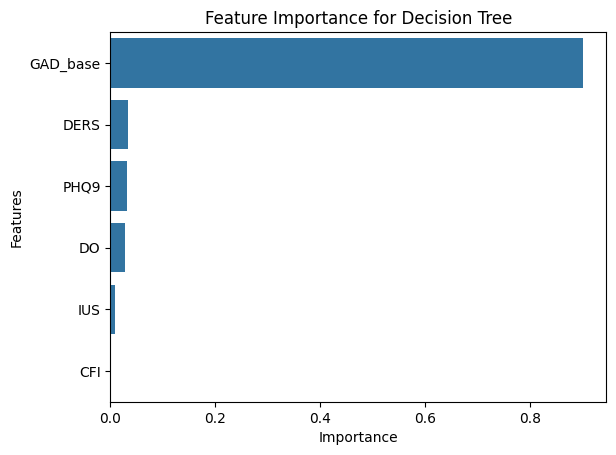

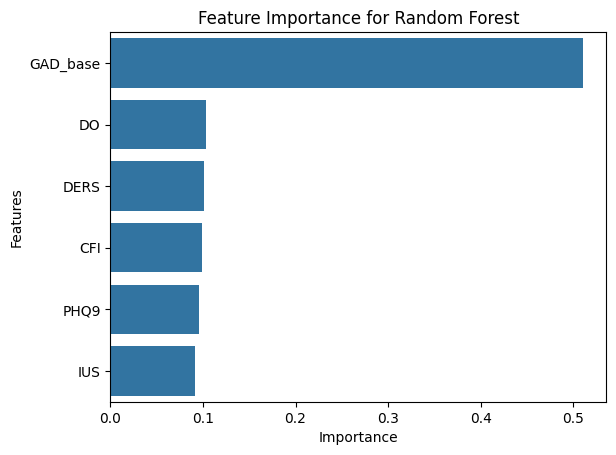

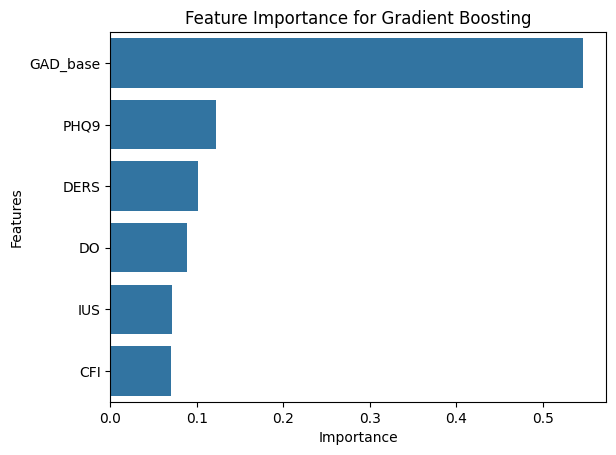

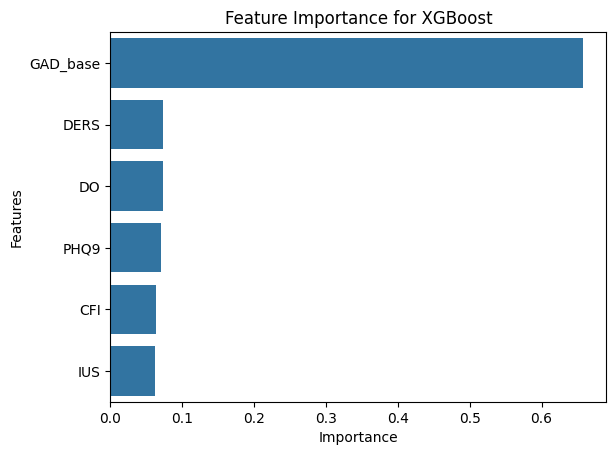

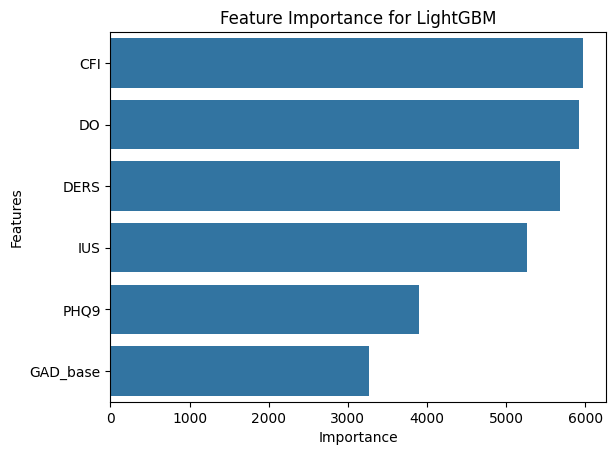

In [127]:
# feature importance plots

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

for i, model in enumerate(models):
    feature_series = pd.Series(data=model.feature_importances_, index=X.columns)
    feature_series = feature_series.sort_values(ascending=False)

    sns.barplot(x=feature_series, y=feature_series.index)
    plt.title(f'Feature Importance for {model_names[i]}')
    plt.xlabel('Importance')
    plt.ylabel('Features')
    
    plt.show()

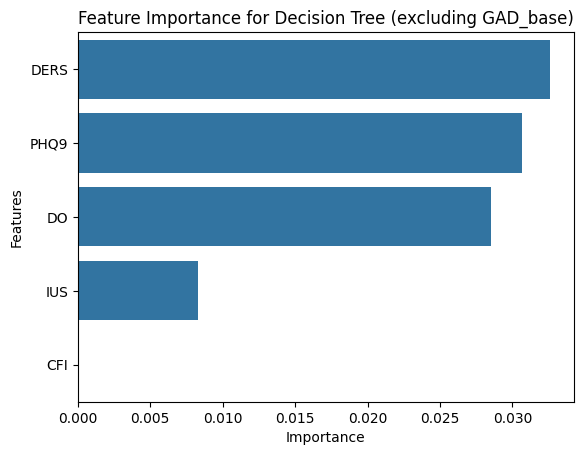

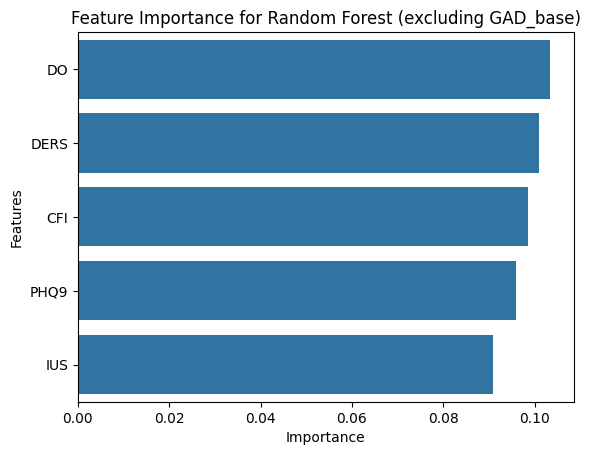

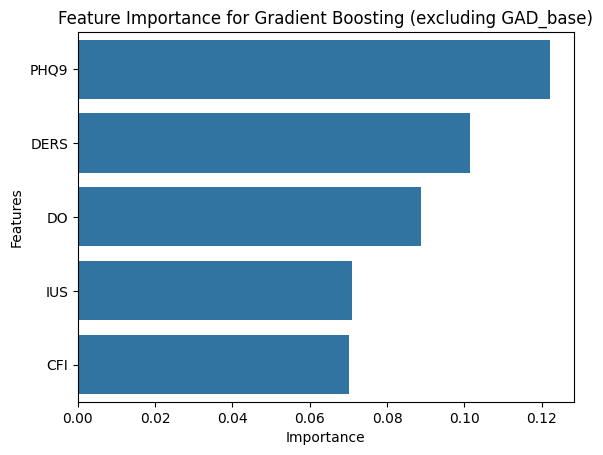

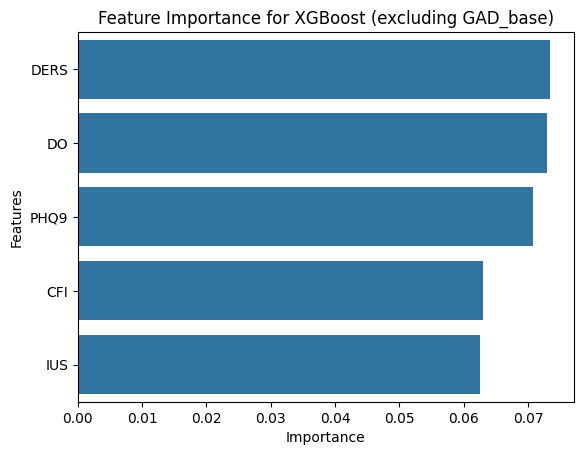

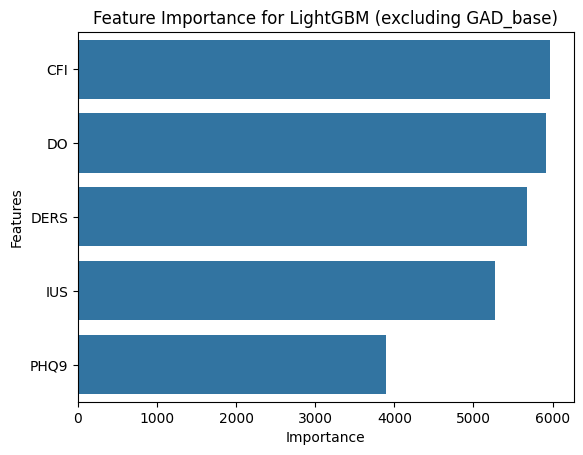

In [128]:
# feature importance plot excluding 'GAD_base'

excluded_feature = 'GAD_base'

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

for i, model in enumerate(models):
    feature_series = pd.Series(data=model.feature_importances_, index=X.columns)
    feature_series = feature_series.drop(excluded_feature, errors='ignore')
    feature_series = feature_series.sort_values(ascending=False)

    sns.barplot(x=feature_series, y=feature_series.index)
    plt.title(f'Feature Importance for {model_names[i]} (excluding {excluded_feature})')
    plt.xlabel('Importance')
    plt.ylabel('Features')
    
    plt.show()

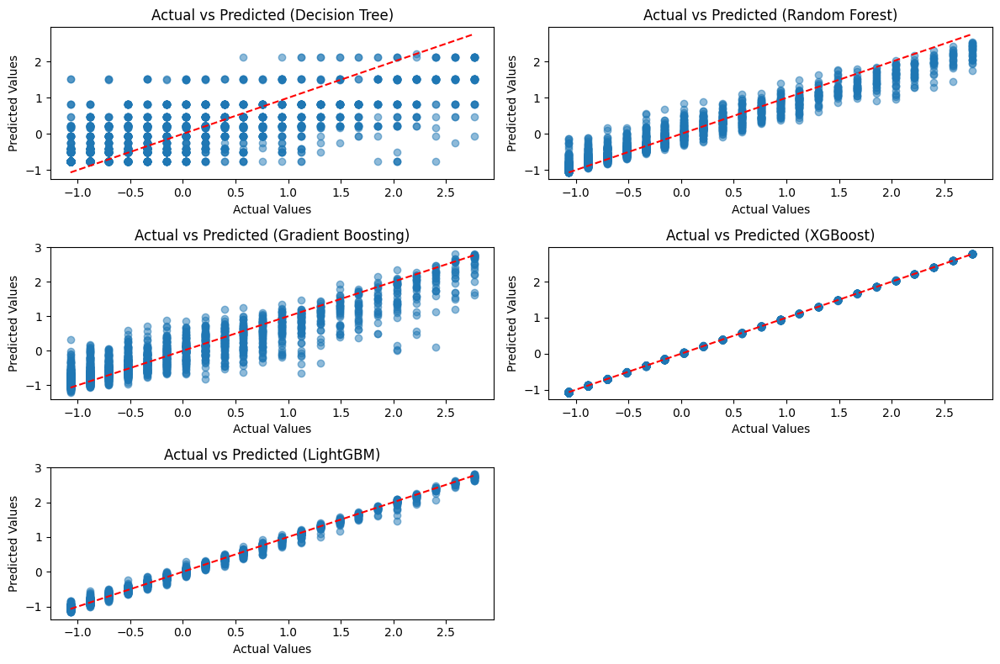

In [129]:
# compare actual and predicted values

models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

plt.figure(figsize=(12, 8))

for i, model in enumerate(models):
    y_pred = model.predict(X) # 예측값 생성

    plt.subplot(3, 2, i + 1)
    
    # 실제값과 예측값 비교
    plt.scatter(y, y_pred, alpha=0.5)
    plt.plot([min(y), max(y)], [min(y), max(y)], color='red', linestyle='--')  # 완벽한 예측을 나타내는 선
    plt.title(f'Actual vs Predicted ({model_names[i]})')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()

In [130]:
# 회귀모델 -> 분류 성능 확인 함수
## GAD_base = 5 -> scaled = -0.196862
## GAD_fu = 5 -> scaled = -0.155137

def evaluate_classification_accuracy(models, model_names, X, y, threshold):
    for i, model in enumerate(models):
        y_pred = model.predict(X)

        # 이진 분류 (threshold 이상이면 1, 미만이면 0)
        y_pred_class = (y_pred >= threshold).astype(int)
        y_actual_class = (y >= threshold).astype(int)

        # 성능 지표 계산
        accuracy = accuracy_score(y_actual_class, y_pred_class)
        precision = precision_score(y_actual_class, y_pred_class)
        recall = recall_score(y_actual_class, y_pred_class)
        f1 = f1_score(y_actual_class, y_pred_class)

        # 결과 출력
        print(f'Model: {model_names[i]}')
        print(f'Accuracy: {accuracy:.3f}')
        print(f'Precision: {precision:.3f}')
        print(f'Recall: {recall:.3f}')
        print(f'F1 Score: {f1:.3f}')
        print('-' * 40)
        
    """
    주어진 회귀 모델 리스트에 대해 이진 분류 후 정확도를 계산하는 함수.

    Parameters:
    - models: 회귀 모델들의 리스트 (예: [dt_reg_model, rf_reg_model, ...])
    - model_names: 모델의 이름 리스트 (예: ['Decision Tree', 'Random Forest', ...])
    - X: 입력 데이터 (피처)
    - y: 실제값 (종속 변수, 레이블)
    - threshold: 이진 분류를 위한 기준값 (default: -)

    Returns:
    - 각 모델에 대한 정확도 출력
    """

In [131]:
models = [dt_reg_model, rf_reg_model, gb_reg_model, xgb_reg_model, lgb_reg_model]
model_names = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM']

evaluate_classification_accuracy(models, model_names, X, y, threshold=-0.155137)

Model: Decision Tree
Accuracy: 0.797
Precision: 0.770
Recall: 0.821
F1 Score: 0.795
----------------------------------------
Model: Random Forest
Accuracy: 0.934
Precision: 0.936
Recall: 0.926
F1 Score: 0.931
----------------------------------------
Model: Gradient Boosting
Accuracy: 0.883
Precision: 0.885
Recall: 0.870
F1 Score: 0.877
----------------------------------------
Model: XGBoost
Accuracy: 0.964
Precision: 1.000
Recall: 0.925
F1 Score: 0.961
----------------------------------------
Model: LightGBM
Accuracy: 0.965
Precision: 0.998
Recall: 0.929
F1 Score: 0.962
----------------------------------------


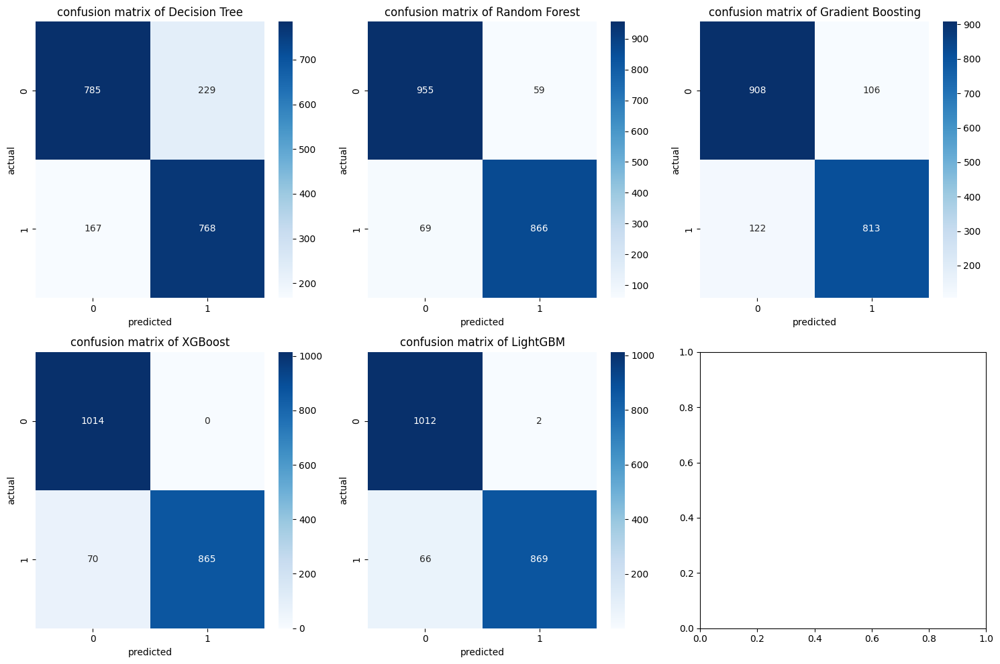

In [115]:
# 각 회귀 모델에 대한 이진 분류 혼동 행렬

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for idx, (model, name) in enumerate(zip(models, model_names)):
    if idx < 5:  # 5개 모델에 대해서만 수행
        y_pred = model.predict(X)
        y_pred_class = (y_pred >= -0.155137).astype(int)
        y_actual_class = (y >= -0.155137).astype(int)
        
        cm = confusion_matrix(y_actual_class, y_pred_class)
        
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[idx])
        axes[idx].set_title(f'confusion matrix of {name}')
        axes[idx].set_xlabel('predicted')
        axes[idx].set_ylabel('actual')

plt.tight_layout()
plt.show()
